# Store Sales - Time Series Forecasting

**Programa de Engenharia de Sistemas e Computação**

**CPS833 - Data Mining**

**Professor**: Geraldo Zimbrão da Silva

**Aluno**: Luiz Henrique Souza Caldas

## Importação das Bibliotecas

In [4]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.signal import periodogram
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier
from datetime import datetime, timedelta

from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_log_error

# Análise Exploratória dos Dados

A classe EDA implementada abaixo é uma ferramenta de Análise Exploratória de Dados para processar e visualizar dados de vendas. Ela permite carregar dados de um arquivo CSV, realizar análises estatísticas e criar visualizações como tabelas, gráficos de tendência, boxplots, histogramas e periodogramas. Além disso, a classe também oferece métodos para análise de sazonalidade e autocorrelação nas séries temporais das vendas, facilitando a identificação de padrões e tendências nos dados.

In [5]:
# Classe para Análise Exploratória dos Dados
class EDA:
    def __init__(self, name, initial=None):
        self.dataset = pd.read_csv(
            name,
            usecols=['store_nbr', 'family', 'date', 'sales', 'onpromotion'],
            dtype={
                'store_nbr': 'category',
                'family': 'category',
                'sales': 'float32',
                'onpromotion': 'uint32',
            },
            parse_dates=['date'],
        )
        self.dataset['date'] = self.dataset.date.dt.to_period('D')

        if initial:
            self.dataset=self.dataset[self.dataset['date'] >= initial]

        self.family_sales = (
             self.dataset
             .drop('onpromotion', axis=1)
             .set_index(['store_nbr', 'family', 'date'])
             .sort_index()
             .groupby(['family', 'date'], observed=False)
             .sum()
             .unstack('family')
             .fillna(0)
             )

    def initial_exploitation(self):
        fig, ax = plt.subplots(nrows=3, ncols=1,figsize=(16, 8))
        df = [self.dataset.head(),self.dataset.tail()]
        for i in range(2):
            ax[i].xaxis.set_visible(False)
            ax[i].yaxis.set_visible(False)
            ax[i].set_frame_on(False)
            table = ax[i].table(cellText=df[i].values, colLabels=df[i].columns, cellLoc='center', loc='center')
            table.auto_set_font_size(False)
            table.set_fontsize(12)
            table.scale(1.2, 1.2)
        ax[0].set_title("head")
        ax[1].set_title("tail")
        texto = f"{self.dataset.isnull().any().sum()} dados faltantes no dataset de treino \n"
        texto += f"{self.dataset.duplicated().sum()} linhas duplicadas no dataset de treino \n"
        texto += f"shape {self.dataset.shape} \n"
        cols_categoricas = self.dataset.select_dtypes(include=['category']).nunique()
        texto += f'{cols_categoricas.shape[0]} colunas de dados categóricos \n'
        num_family= cols_categoricas['family']
        texto += f'{num_family} familias diferentes \n'
        ax[2].text(0.5, 0.5, texto, fontsize=12, ha='center', va='center', wrap=True)
        ax[2].xaxis.set_visible(False)
        ax[2].yaxis.set_visible(False)
        ax[2].set_frame_on(False)
        plt.tight_layout()
        plt.show()

    def plot_periodogram(self, y, familia, ax):
        # Periodograma
        f, Pxx = periodogram(
            y.values.reshape(-1),
            fs=pd.Timedelta("365D") / pd.Timedelta("1D"),
            detrend='linear',
            window="boxcar",
            scaling='spectrum',
        )
        # return print(y, f, Pxx), print(type(y), type(f), type(Pxx))
        ax.step(f, Pxx, color="purple")
        ax.set_xscale("log")
        ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
        ax.set_xticklabels(
            [
                "Annual (1)",
                "Semiannual (2)",
                "Quarterly (4)",
                "Bimonthly (6)",
                "Monthly (12)",
                "Biweekly (26)",
                "Weekly (52)",
                "Semiweekly (104)",
            ],
            rotation=30,
        )
        ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
        ax.set_ylabel("Variance")
        ax.set_title(f'Periodograma de {familia}')
        return ax

    def family_analysis(self, familia):
        df = self.family_sales.loc(axis=1)[:, familia]
        df.index = df.index.to_timestamp()
        fig = plt.figure(figsize=(10, 8))
        gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 1])
        # Plot sales e trend
        ax0 = fig.add_subplot(gs[0, :])
        trend365 =  df['sales'].rolling(
                        window=365,
                        center=True,
                        min_periods=183,
                    ).mean()
        trend30 =  df['sales'].rolling(
                        window=30,
                        center=True,
                        min_periods=15,
                    ).mean()
        ax0.plot(df.index, df['sales'], marker='.', linestyle='-', color='0.25', label='vendas', linewidth=1, markersize=4)
        ax0.plot(df.index, trend365, color='blue', label='média móvel (365 dias)')
        ax0.plot(df.index, trend30, color='red', label='média móvel (30 dias)')
        ax0.set_title(f'Vendas e tendências para {familia}')
        ax0.set_xlabel('Date')
        ax0.set_ylabel(familia)
        ax0.legend()
        # Boxplot e Histograma
        ax1 = fig.add_subplot(gs[1, 0])
        df['sales'].plot(kind='box', ax=ax1)
        ax1.set_title(f'Boxplot de {familia}')
        ax1.set_xlabel('')
        ax2 = fig.add_subplot(gs[1, 1])
        sns.histplot(data=df, x=('sales', familia), kde=True, bins=10, ax=ax2)
        ax2.set_title(f'Histograma de {familia}')
        ax2.set_xlabel(familia)
        ax2.set_ylabel('Density')
        # Periodograma
        ax3 = fig.add_subplot(gs[2, :])
        ax3 = self.plot_periodogram(df['sales'],familia,ax3)
        plt.tight_layout()
        plt.show()

    def all_families_analysis(self):
        df = self.family_sales
        familias = df.select_dtypes(include=['number']).columns.tolist()
        for familia in familias:
            self.family_analysis(familia[1])
       
    def calc_deseason(self, familia, freq, order):
        sales = self.family_sales.loc(axis=1)[:, familia]
        y = sales.loc[:, 'sales'].squeeze()
        # vendas e sua sazonalidade
        fourier = CalendarFourier(freq=freq, order=order)
        dp = DeterministicProcess(
            index=y.index,
            constant=True,
            order=1,
            seasonal=True,
            additional_terms=[fourier],
            drop=True,
        )
        X = dp.in_sample()
        model = LinearRegression(fit_intercept=False).fit(X, y)
        y_pred = pd.Series(model.predict(X), index=X.index)
        y_dessaz = pd.Series(y.values - y_pred.values, index=X.index)
        return y, y_pred, y_dessaz

    def family_deseason(self, familia, freq, order):
        y, y_pred, y_dessaz = self.calc_deseason(familia, freq, order)
        _, ax = plt.subplots(nrows=3, figsize=(16, 8))
        ax[0].plot(y.index.to_timestamp(), y.values, marker='.', linestyle='-', color='0.25', label='vendas', linewidth=1, markersize=4)
        ax[0].plot(y.index.to_timestamp(), y_pred, label='sazonalidade')
        ax[0].plot(y.index.to_timestamp(), y_dessaz, label='dessazonalizado')
        ax[0].set_title(f'Vendas e sazonalidade para {familia}')
        ax[0].set_ylabel('vendas')
        ax[0].legend()
        # periodorama sazonal
        ax[1] = self.plot_periodogram(y, familia, ax[1])
        ax[1].set_title(f'Periodograma de {familia} sazonal')
        # periodorama dessazonalizado
        ax[2] = self.plot_periodogram(y_dessaz, familia, ax[2])
        ax[2].set_title(f'Periodograma de {familia} dessazonalizado')
        y_lim = ax[1].get_ylim()
        ax[2].set_ylim(top=y_lim[1])
        plt.tight_layout()
        plt.show()

    def all_families_deseason(self, freq, order):
        df = self.family_sales
        familias = df.select_dtypes(include=['number']).columns.tolist()
        for familia in familias:
            self.family_deseason(familia[1], freq, order)

    def family_lag(self, familia, freq, order, max_lag=8):
        _, _, y_dessaz = self.calc_deseason(familia, freq, order)
        df = y_dessaz.to_frame(name='sales')
        # Gerando as colunas de lag
        for lag in range(1, max_lag + 1):
            df[f'lag_{lag}'] = df['sales'].shift(lag)

        # Definindo o número de colunas e linhas para os subplots
        num_cols = 4
        num_rows = (max_lag + 1) // num_cols + ((max_lag + 1) % num_cols > 0) 
        print(num_rows)
        fig = plt.figure(figsize=(20, 10))
        gs = plt.GridSpec(num_rows, num_cols, wspace=0.2, hspace=0.6)
        # Plotando os gráficos de dispersão
        for lag in range(1, max_lag + 1):
            correlation = df['sales'].corr(df[f'lag_{lag}'])
            row_idx = (lag-1) // num_cols  # Índice da linha para o subplot
            col_idx = (lag-1) % num_cols  # Índice da coluna para o subplot
            ax = fig.add_subplot(gs[row_idx, col_idx]) if num_rows > 1 else fig.add_subplot(gs[col_idx])
            sns.scatterplot(x=f'lag_{lag}', y='sales', data=df, ax=ax)
            sns.regplot(x=f'lag_{lag}', y='sales', data=df, scatter=False, color='red', ci=None, ax=ax)
            ax.set_title(f'Lag {lag} vs {familia:5}')
            ax.set_xlabel(f'Lag {lag}')
            ax.set_ylabel('Vendas')
            ax.grid(True)
            ax.text(0.05, 0.95, f'r: {correlation:.2f}', transform=ax.transAxes, fontsize=12,
                    verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))
        ax_acf = fig.add_subplot(gs[-1, :])
        plot_pacf(df['sales'], lags=max_lag, ax=ax_acf)
        acf_values = pacf(df['sales'], nlags=max_lag)
        delta = 0.05
        ax_acf.set_ylim(top=max(max(acf_values), 0) + delta, bottom=min(min(acf_values), 0) - delta)
        ax_acf.set_xlabel('Lag')
        ax_acf.set_ylabel('Autocorrelation')
        ax_acf.grid(True)
        plt.show()

    def all_families_lag(self, freq, order, max_lag=8):
        df = self.family_sales
        familias = df.select_dtypes(include=['number']).columns.tolist()
        for familia in familias:
            self.family_lag(familia[1], freq, order, max_lag)

O trecho abaixo cria duas instâncias da classe EDA para analisar dados de vendas. A primeira instância é criada sem restrição de data inicial, realizando uma análise exploratória inicial que inclui a criação de tabelas com informações estatísticas sobre os dados, como dados faltantes, duplicados, formas dos dados, e quantidade de colunas categóricas e famílias distintas. A segunda instância é criada com a data inicial definida em '2017-01-01', e é utilizada para analisar tendências, sazonalidade e autocorrelação das vendas das diferentes famílias ao longo do tempo, incluindo a aplicação de médias móveis, plotagem de periodogramas e análise de correlação entre lags das séries temporais. Essa estrutura permite uma análise abrangente e flexível dos dados de vendas em diferentes contextos e períodos.

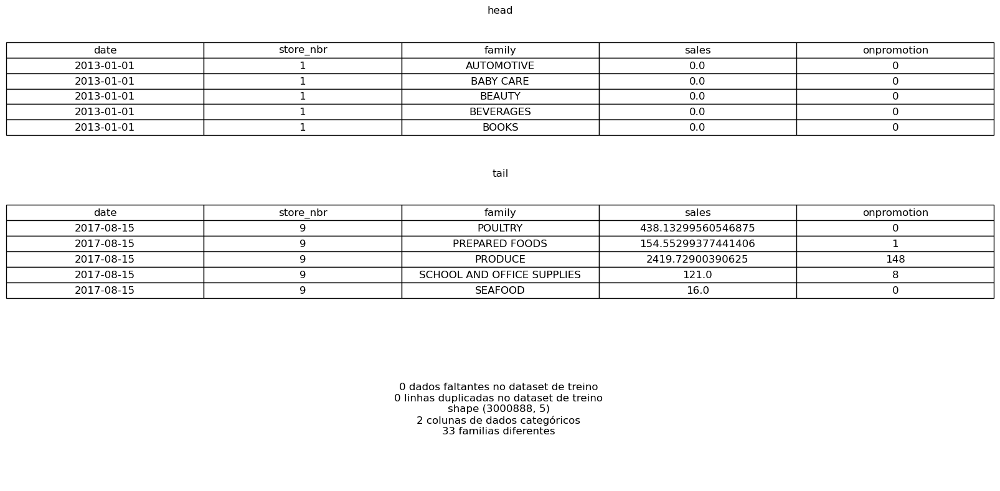

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


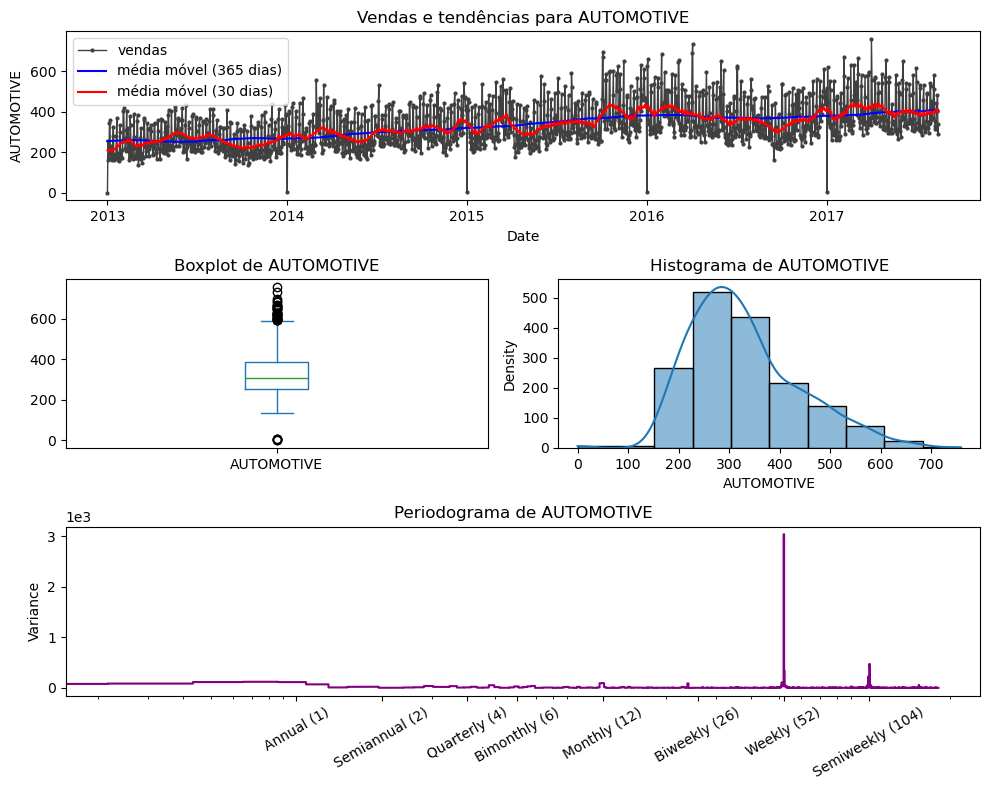

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


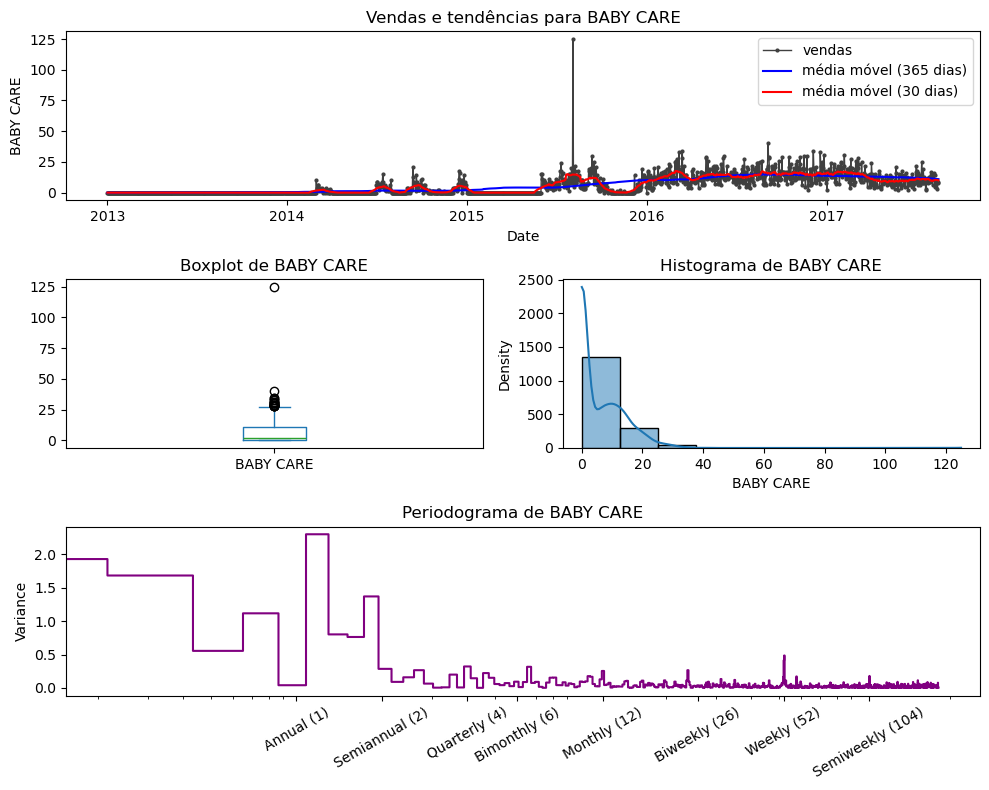

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


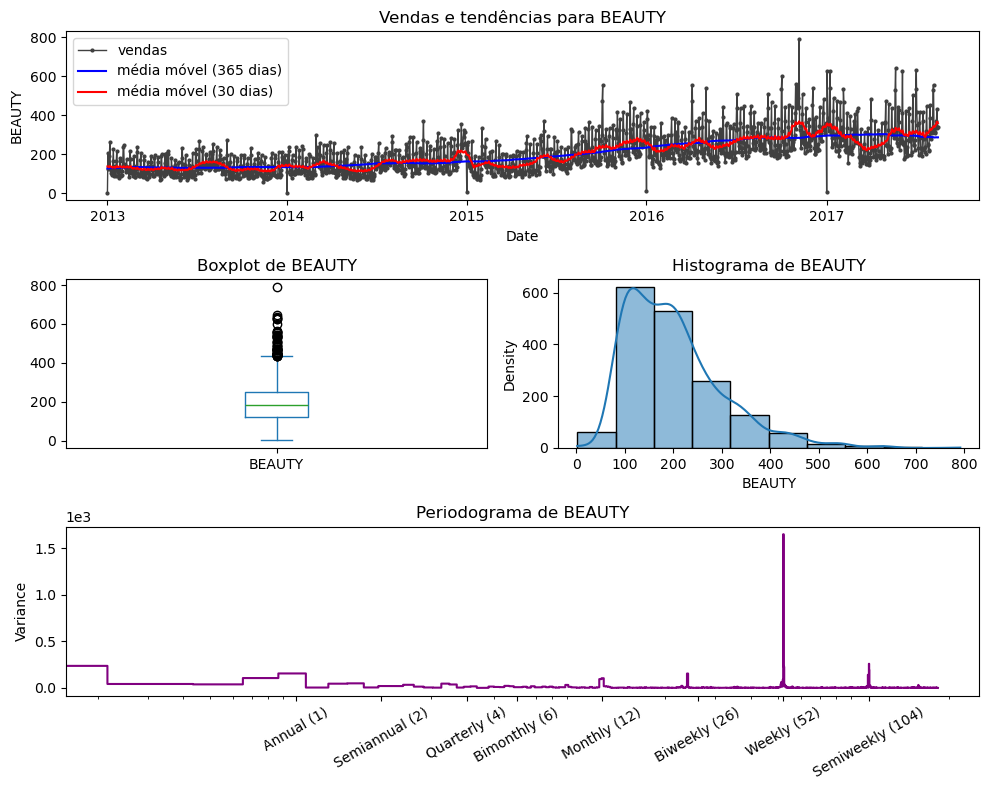

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


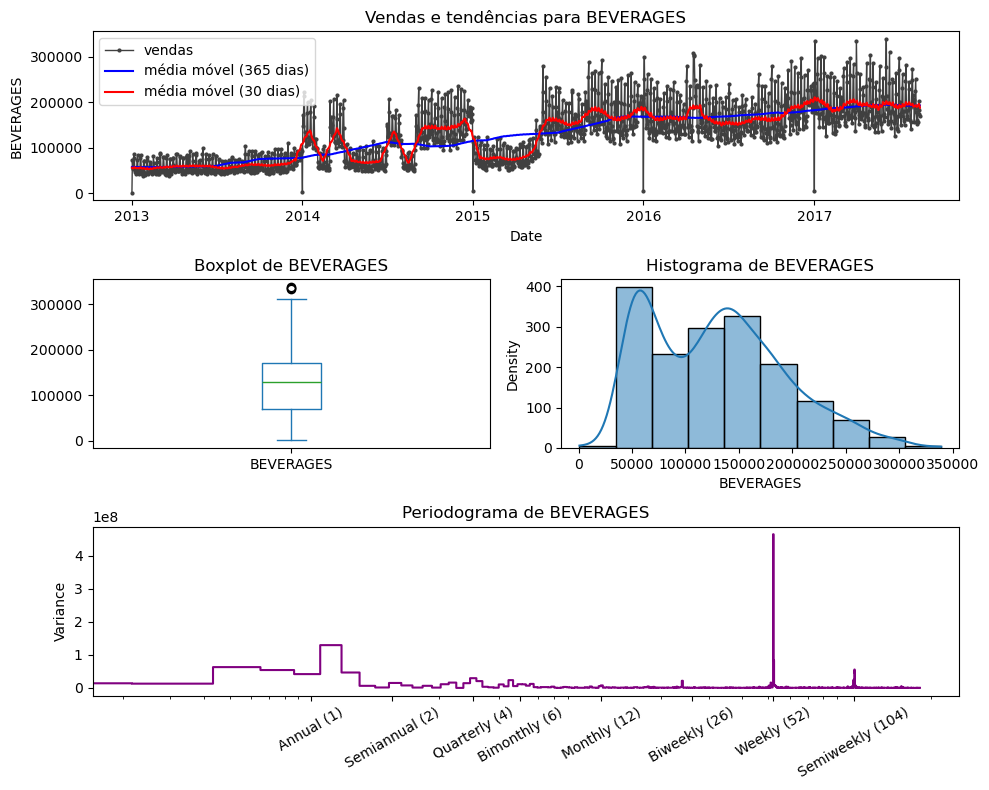

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


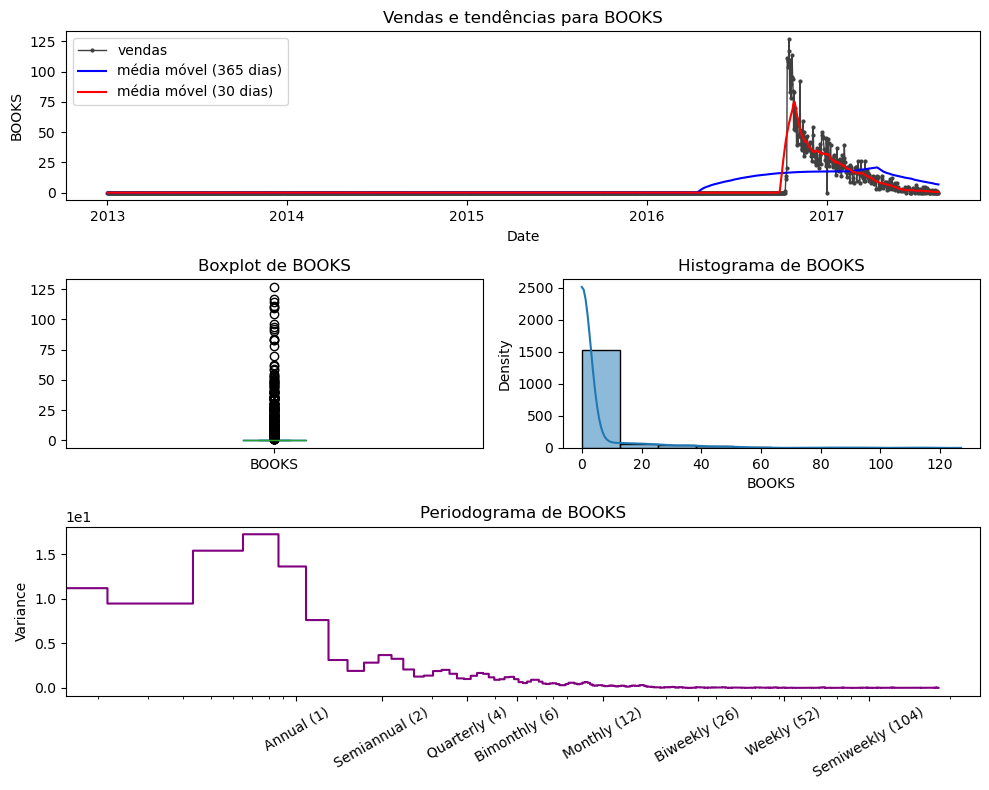

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


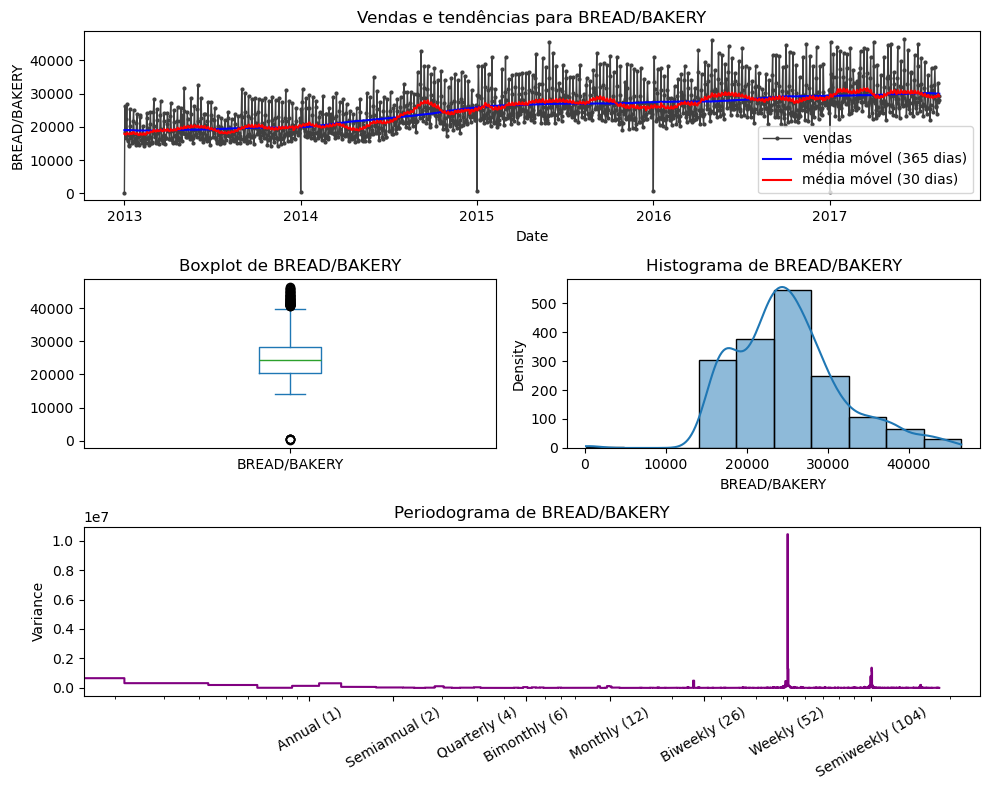

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


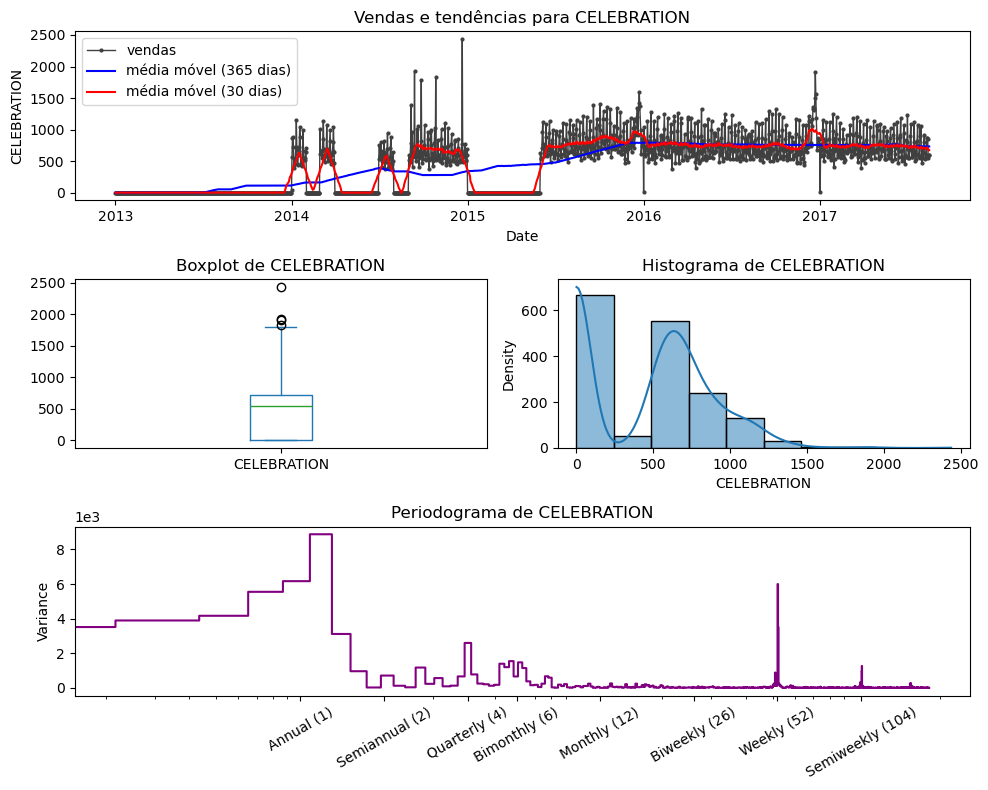

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


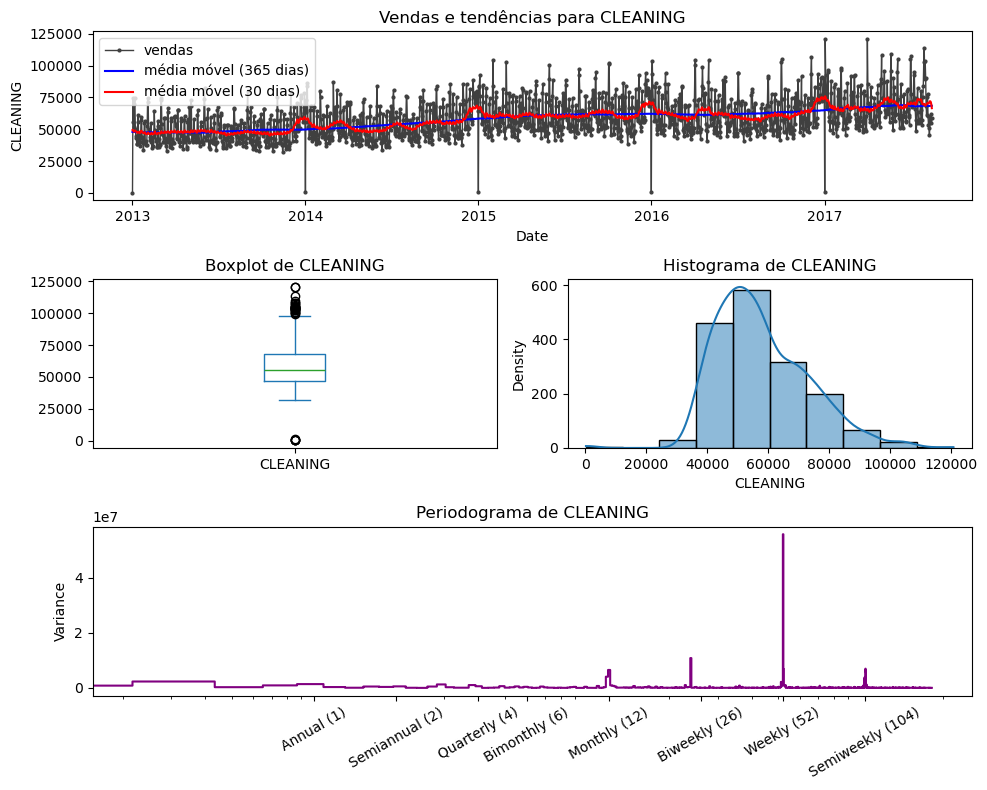

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


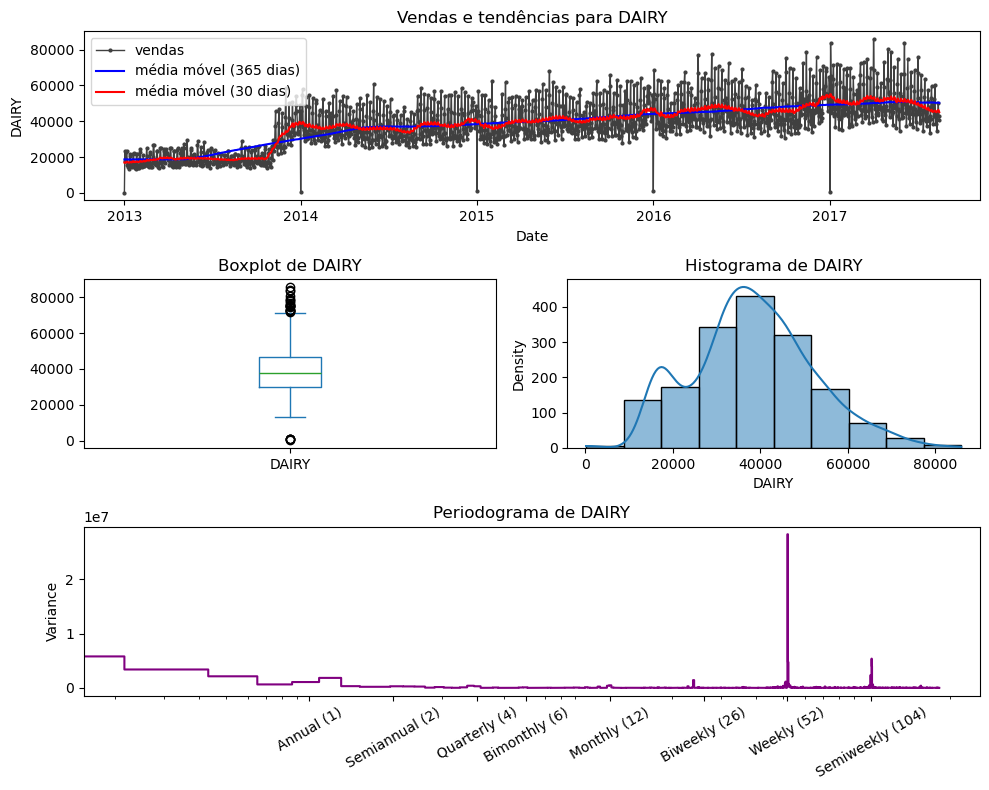

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


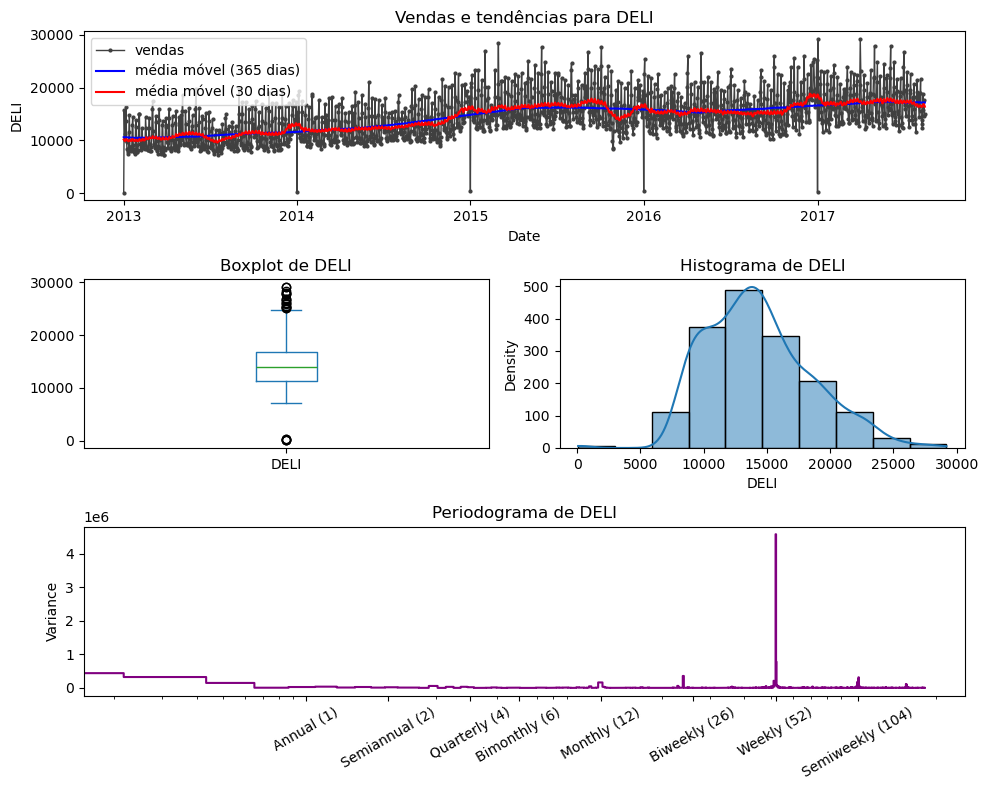

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


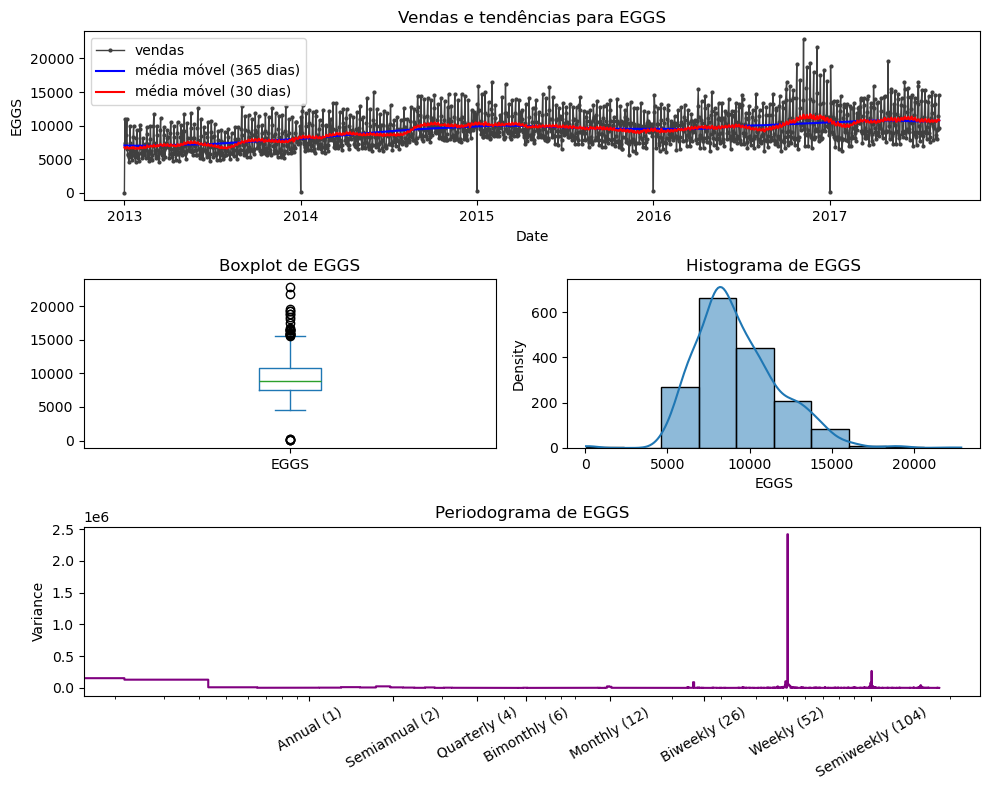

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


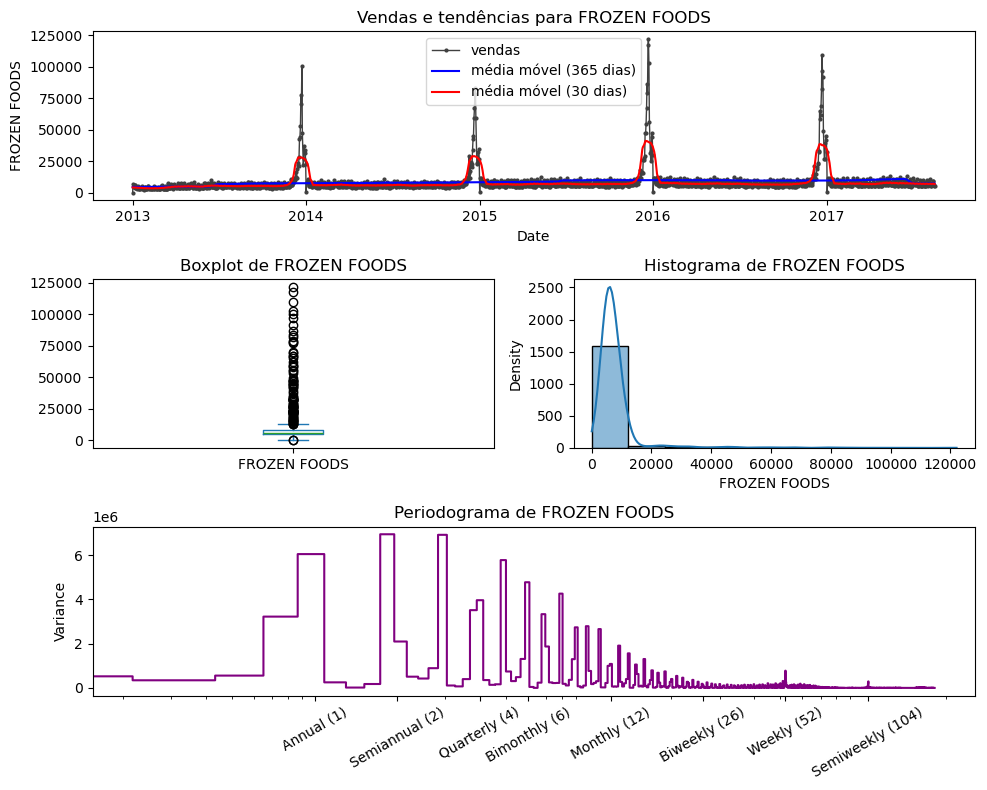

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


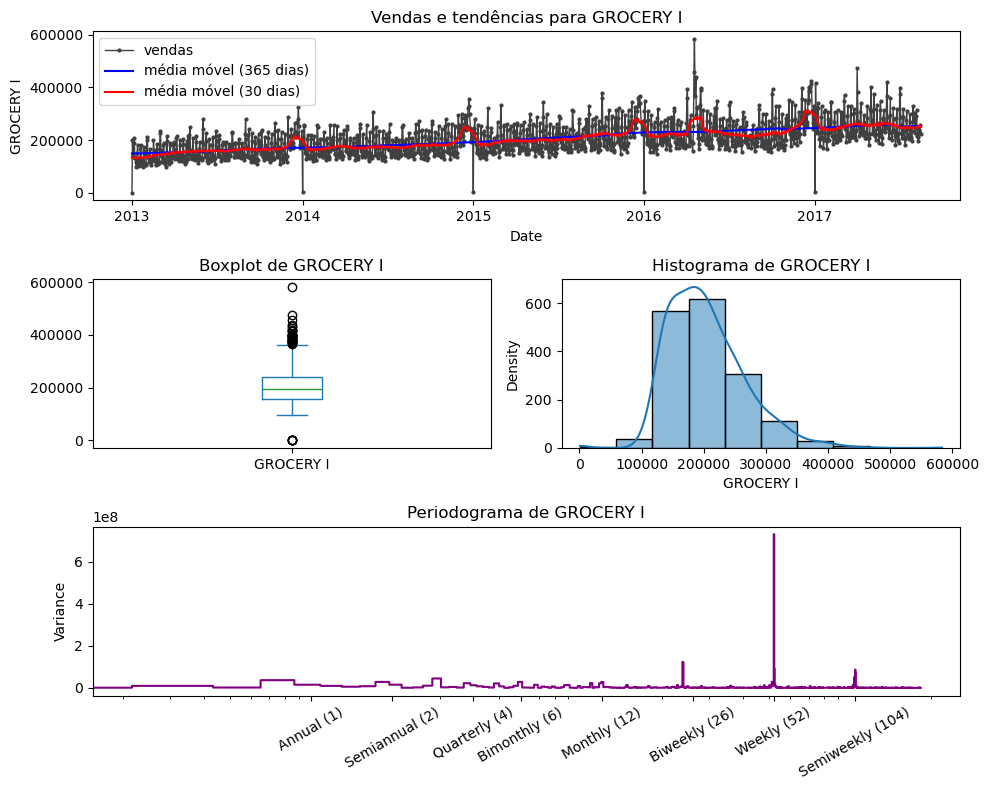

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


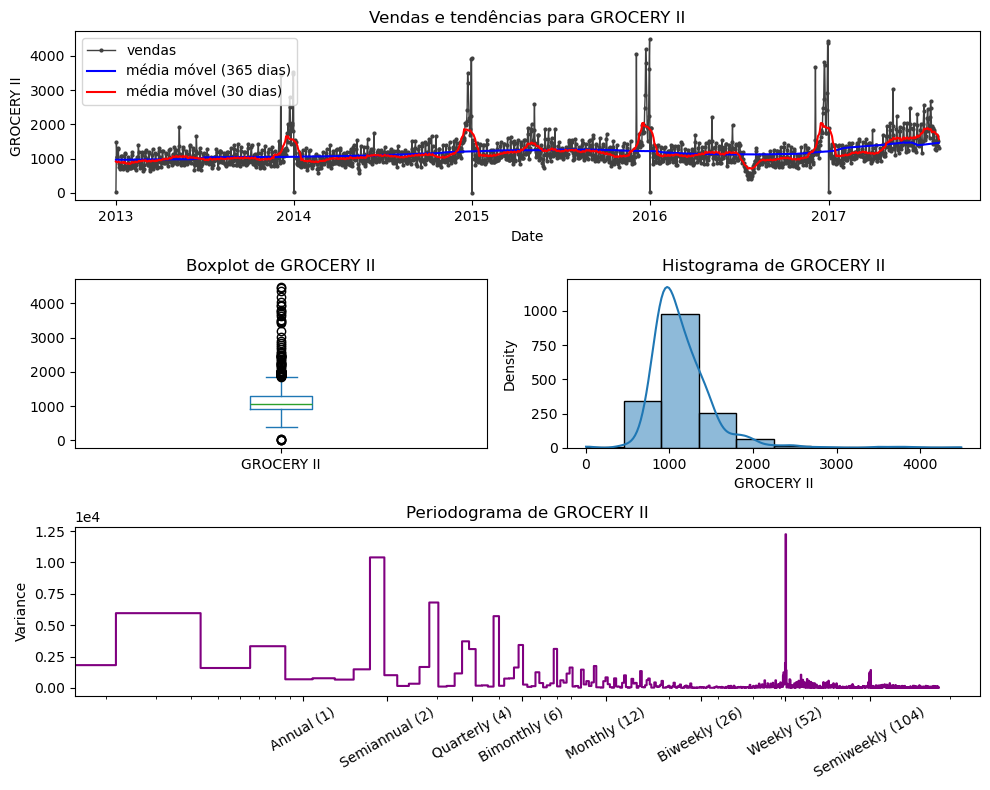

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


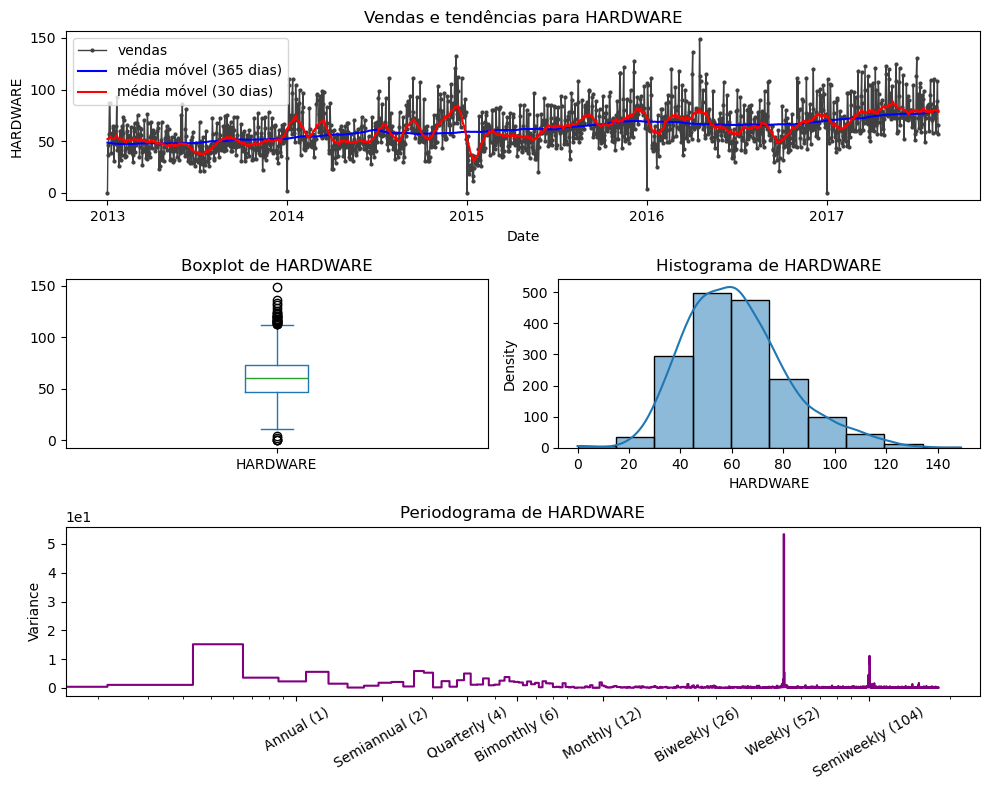

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


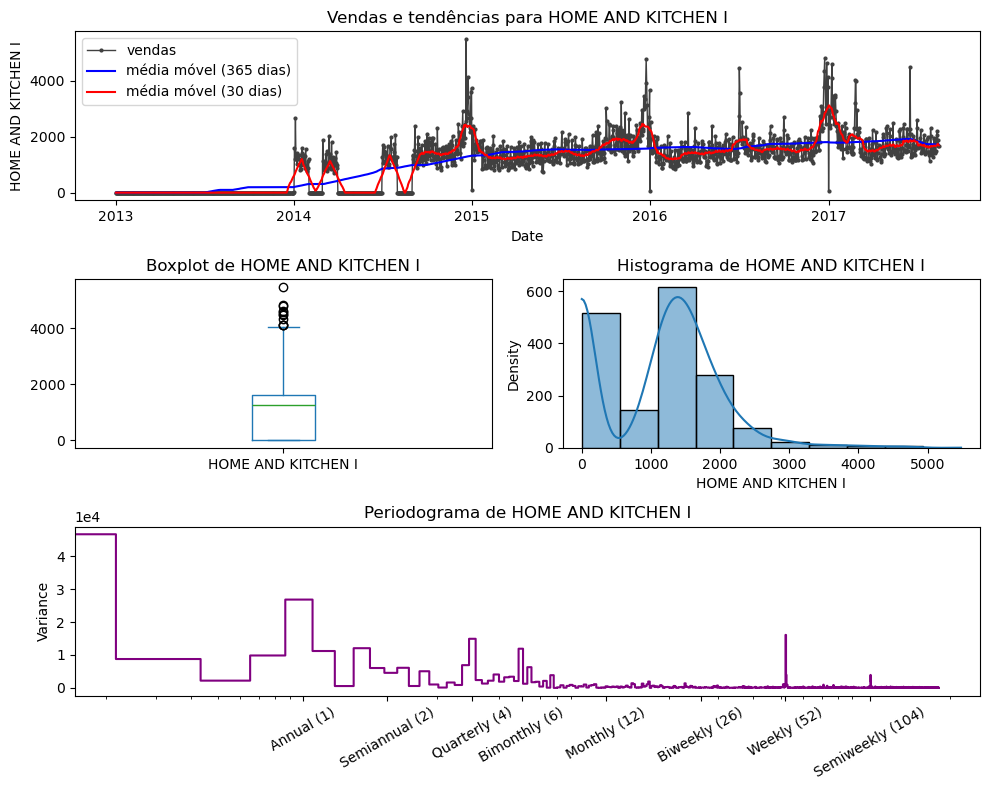

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


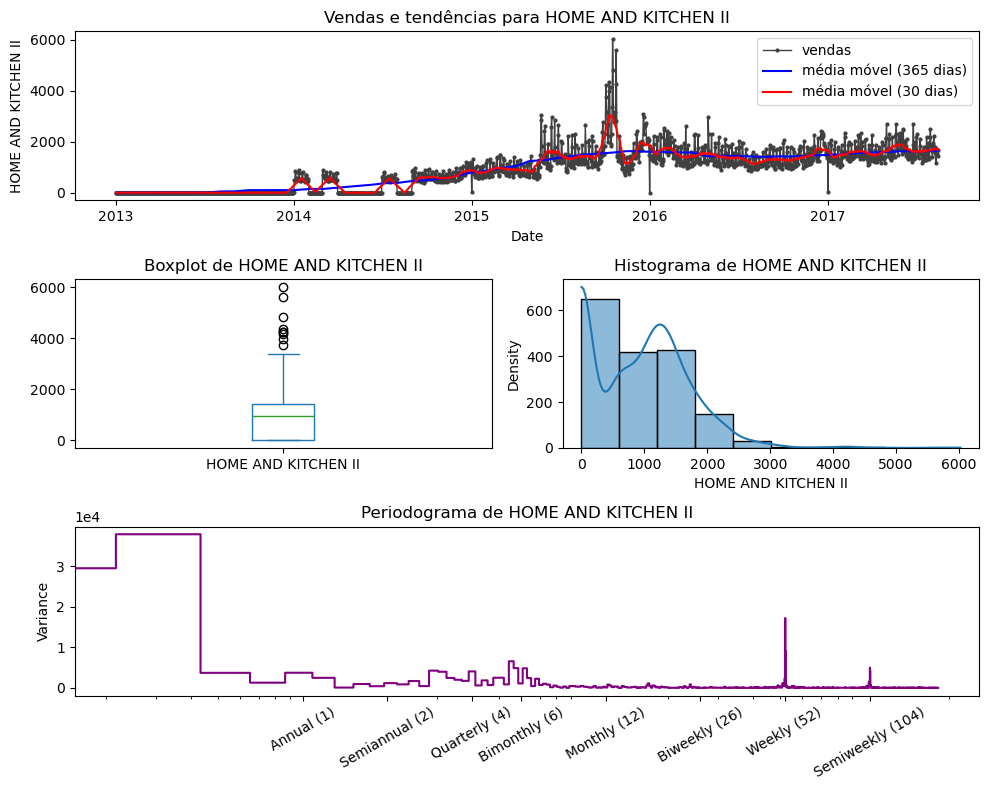

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


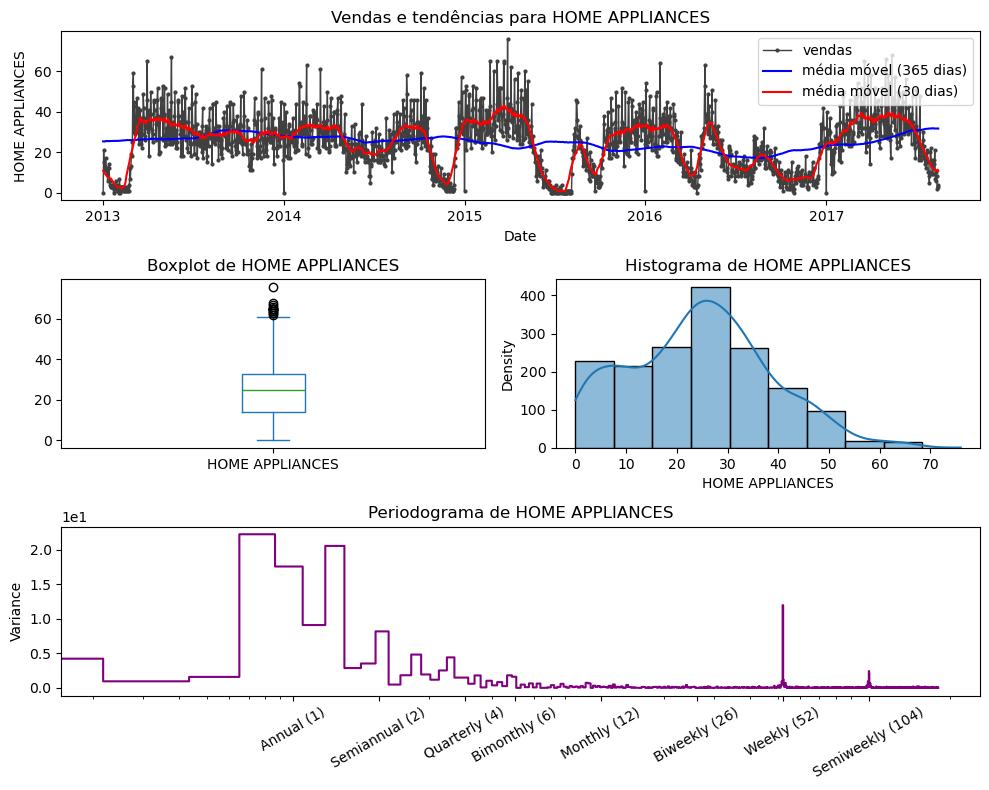

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


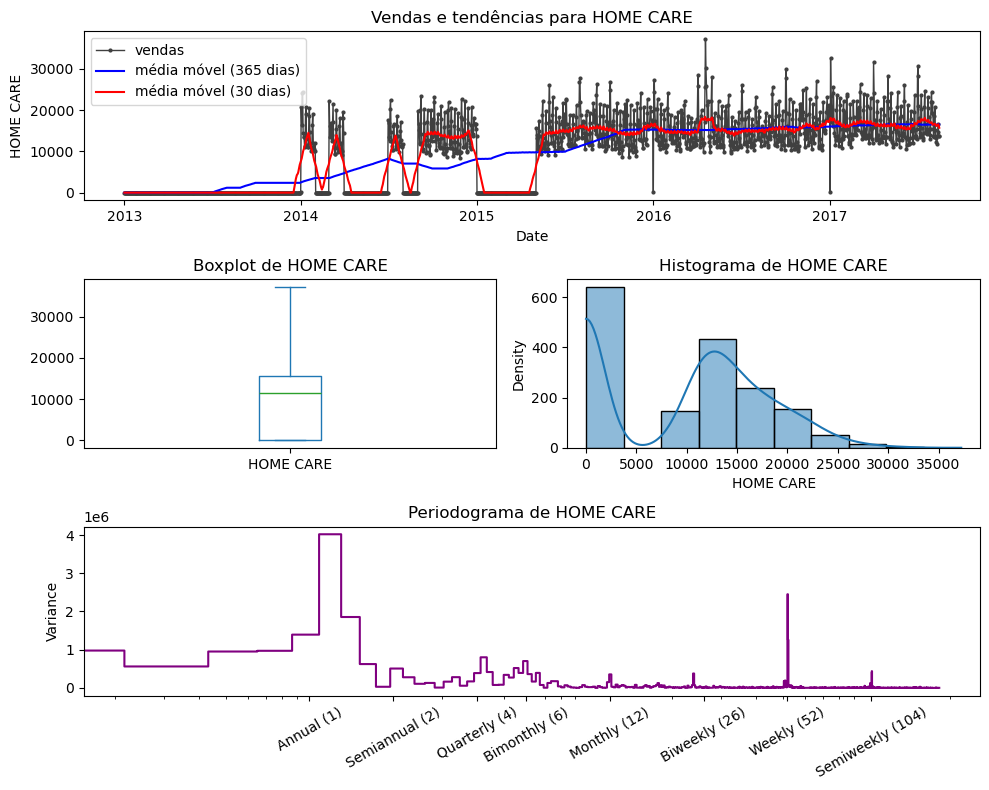

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


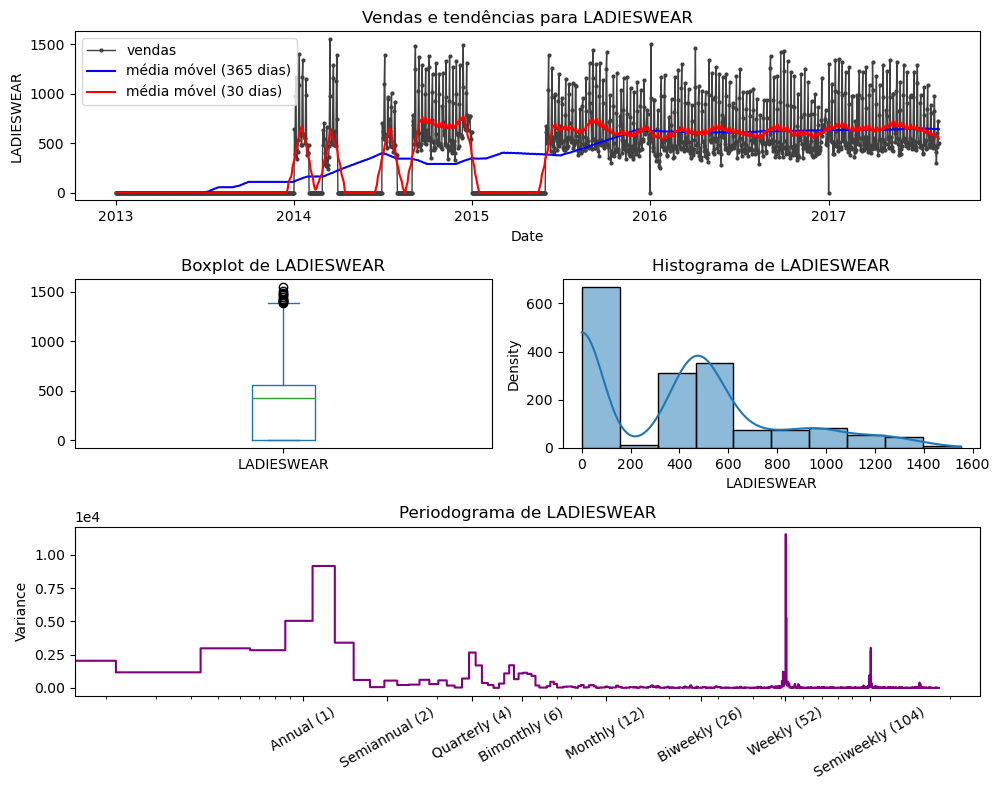

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


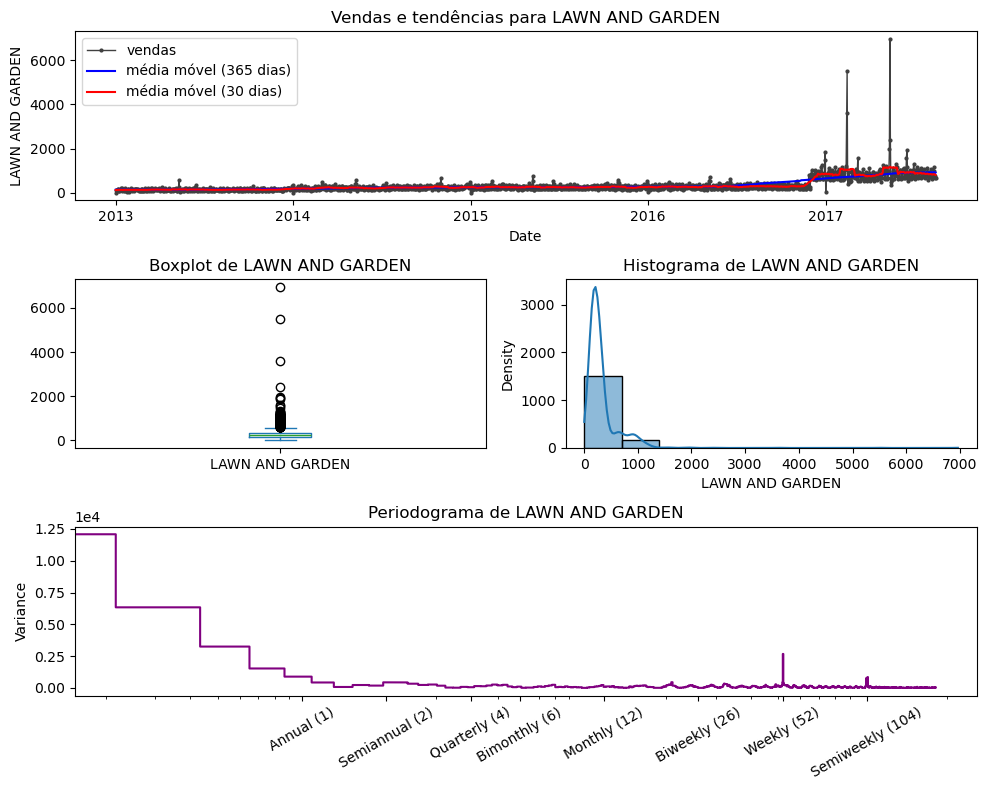

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


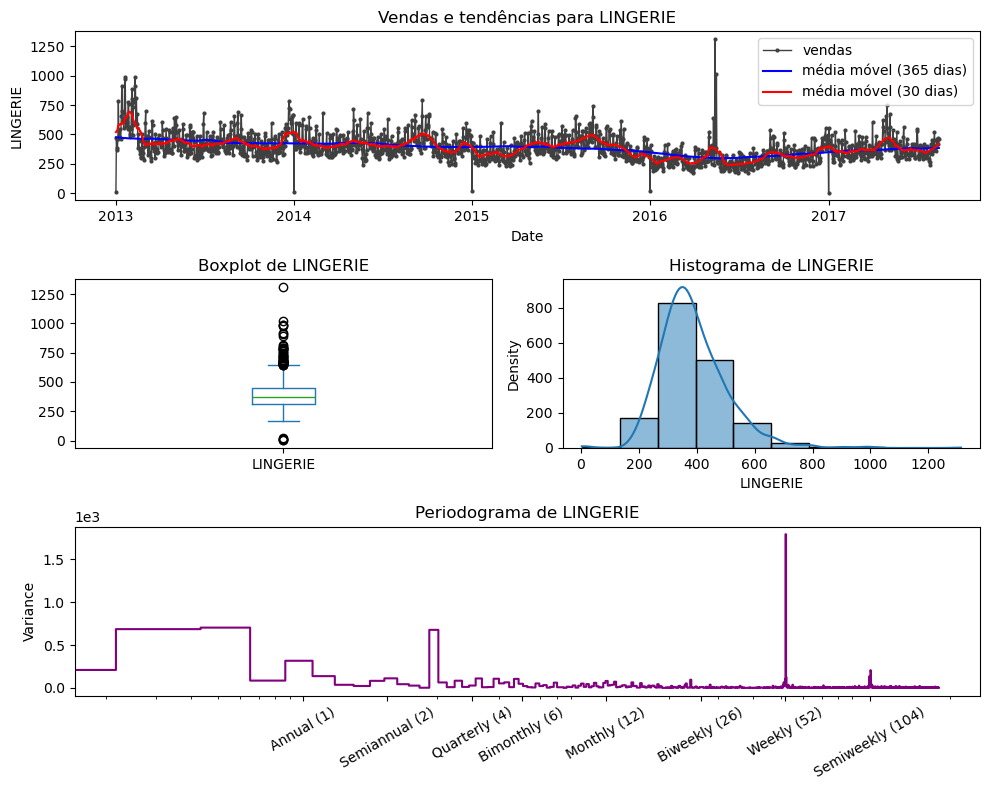

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


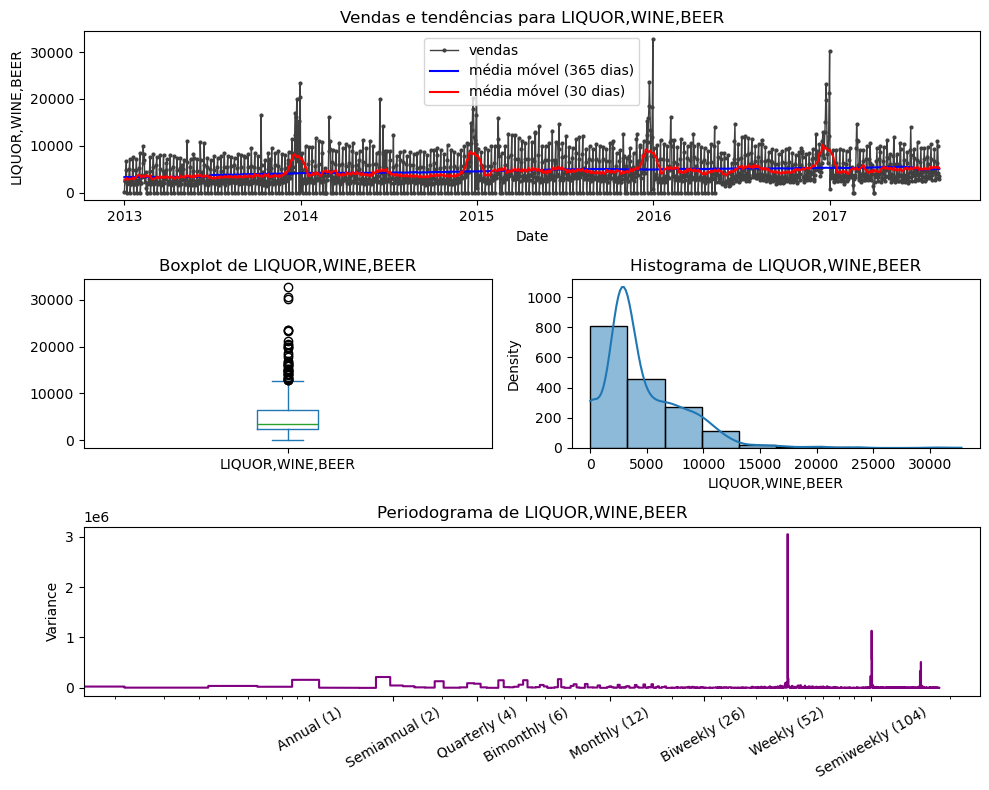

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


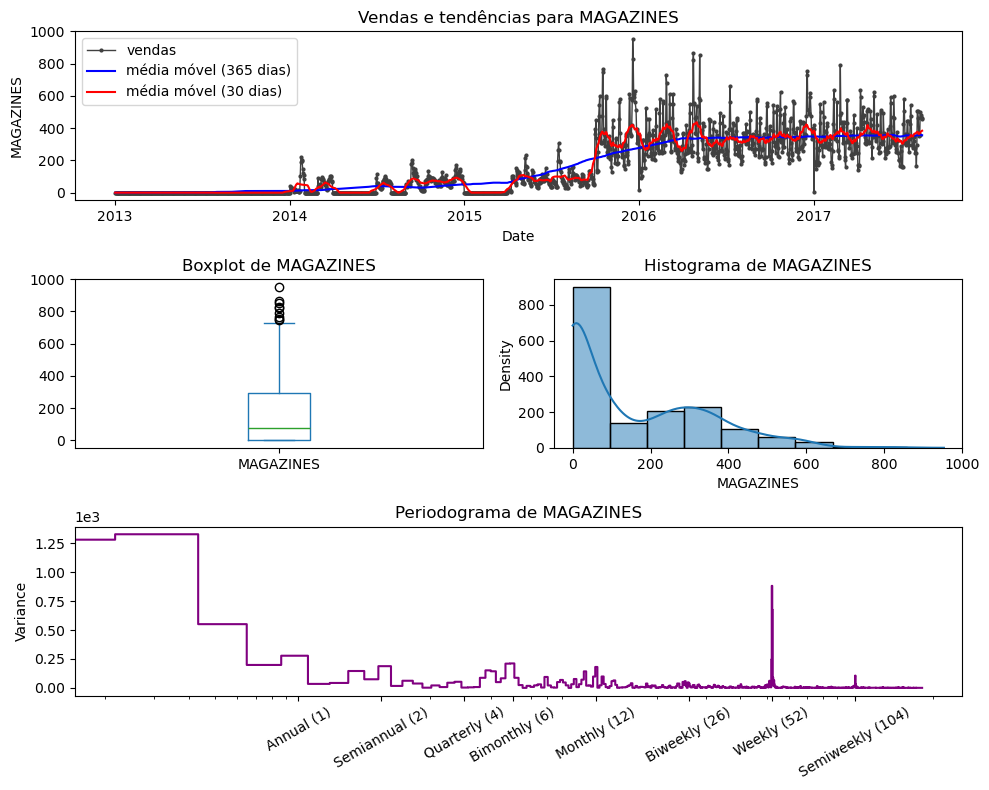

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


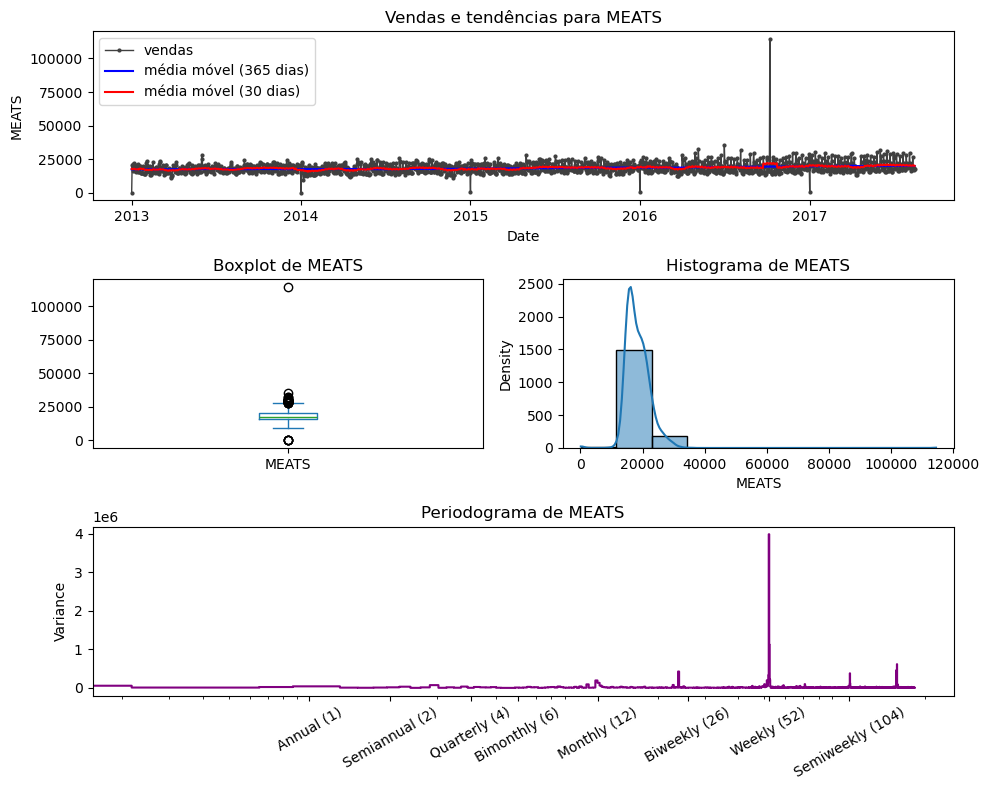

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


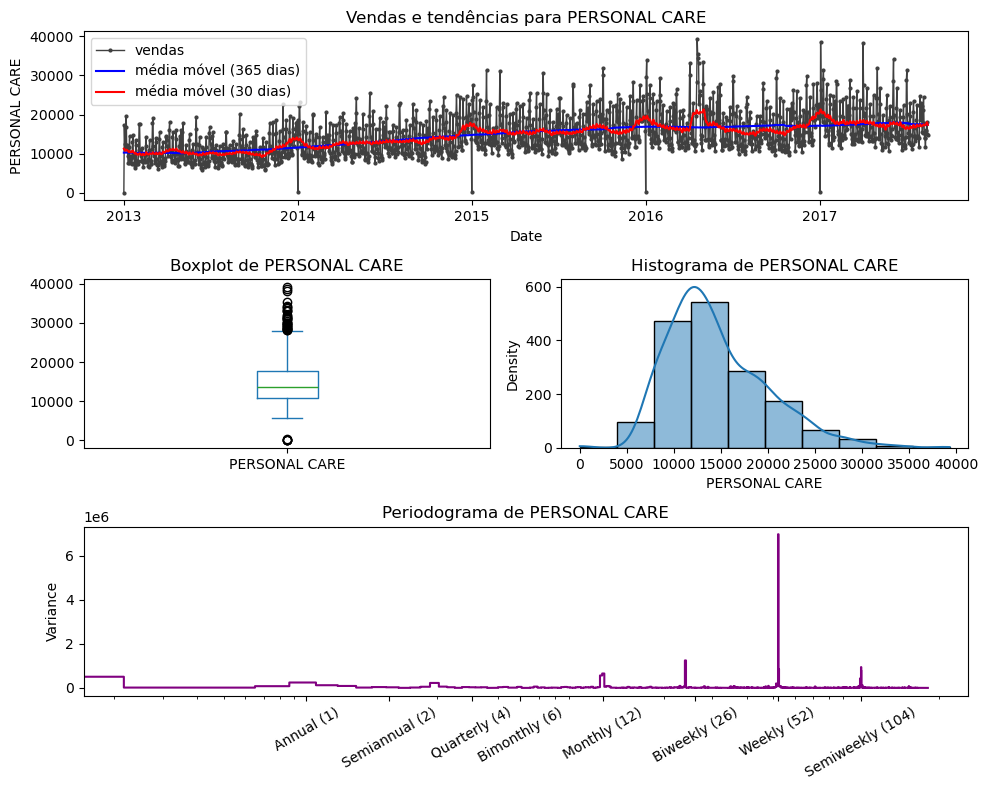

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


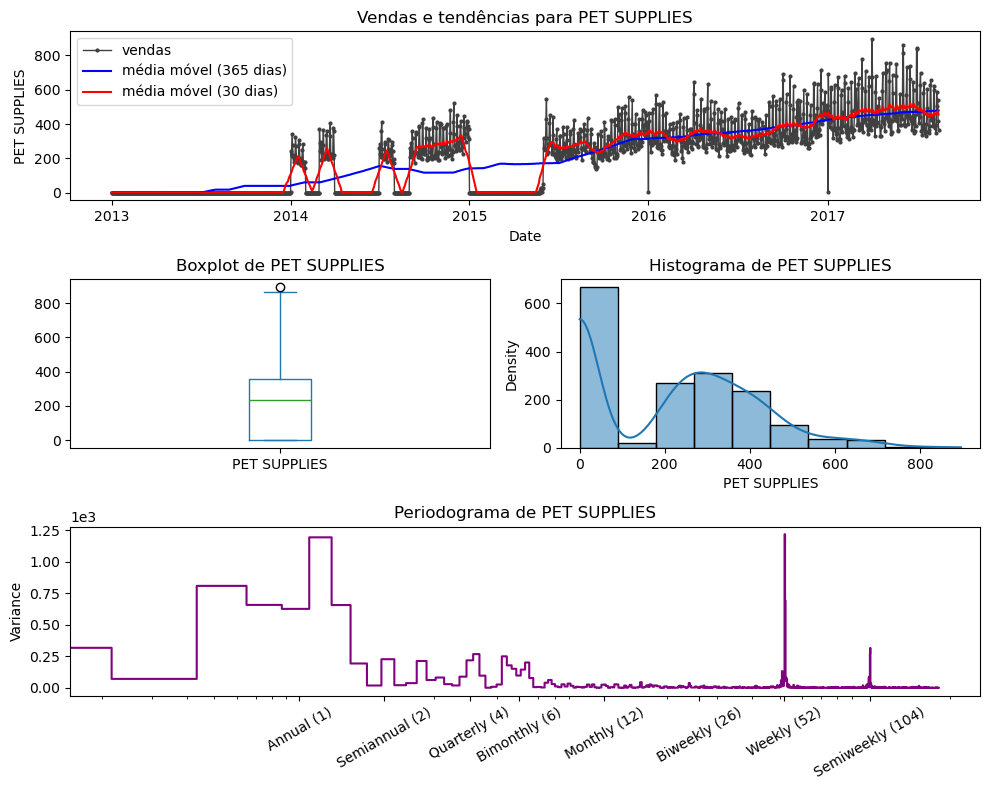

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


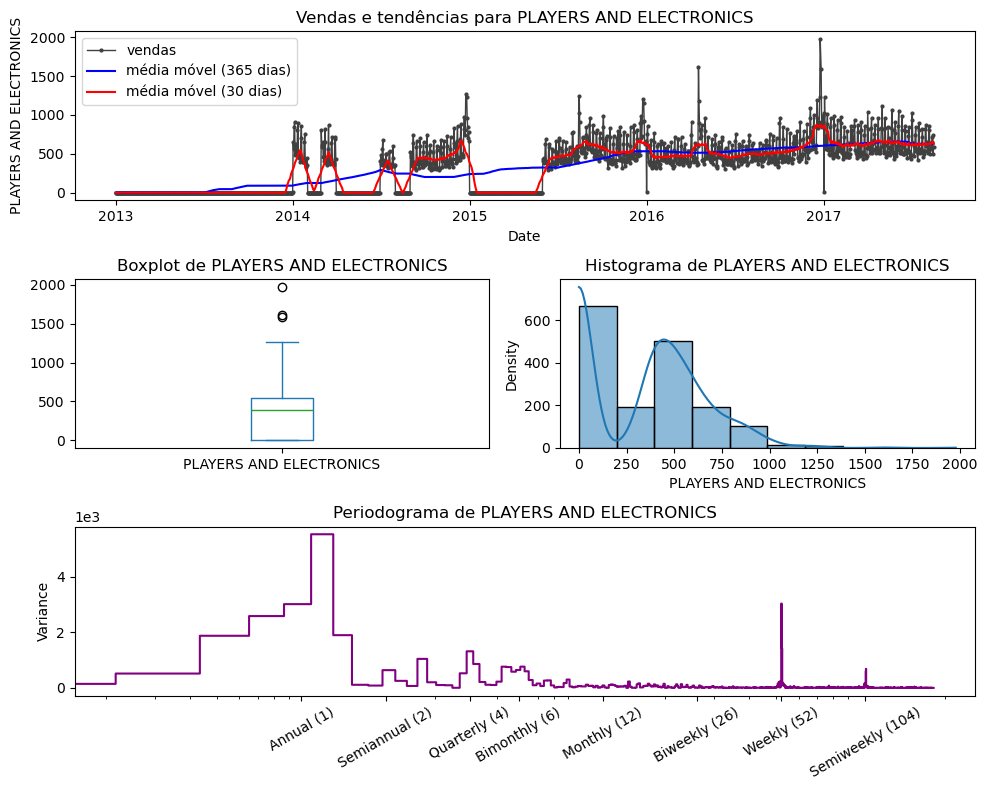

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


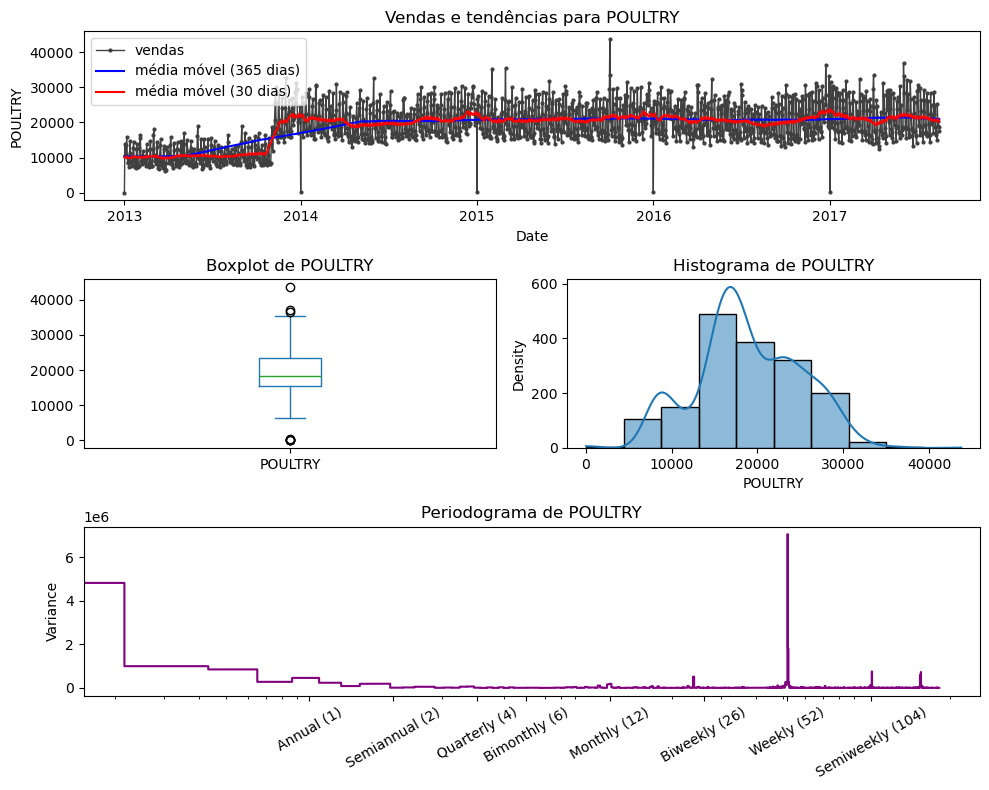

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


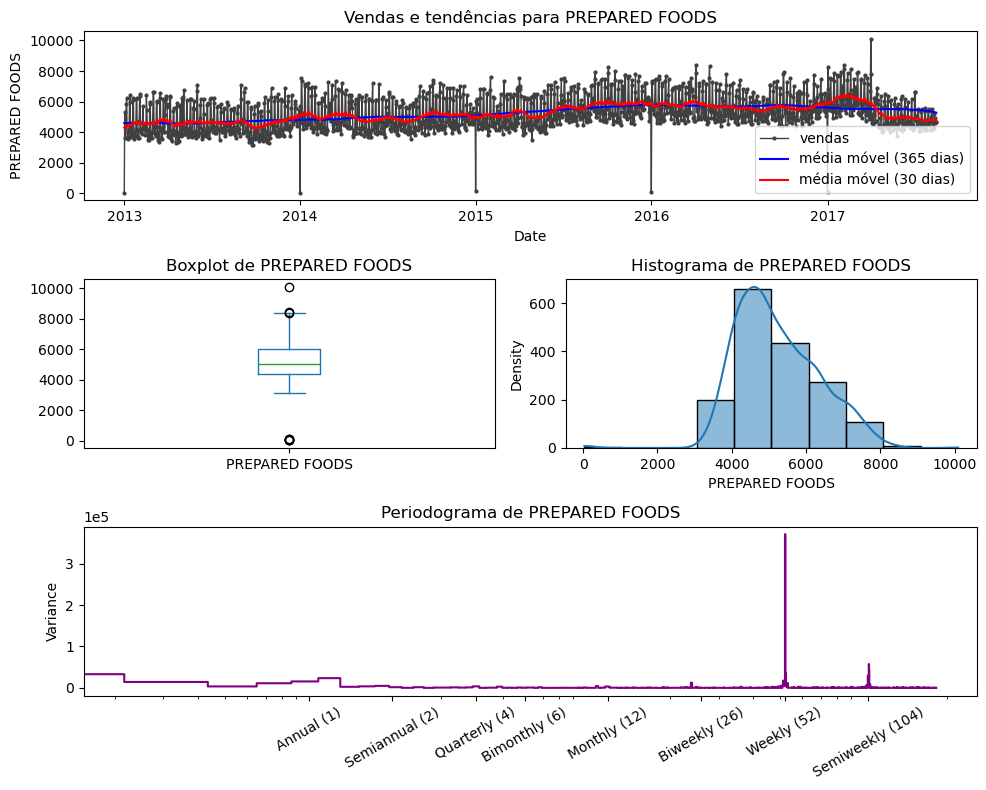

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


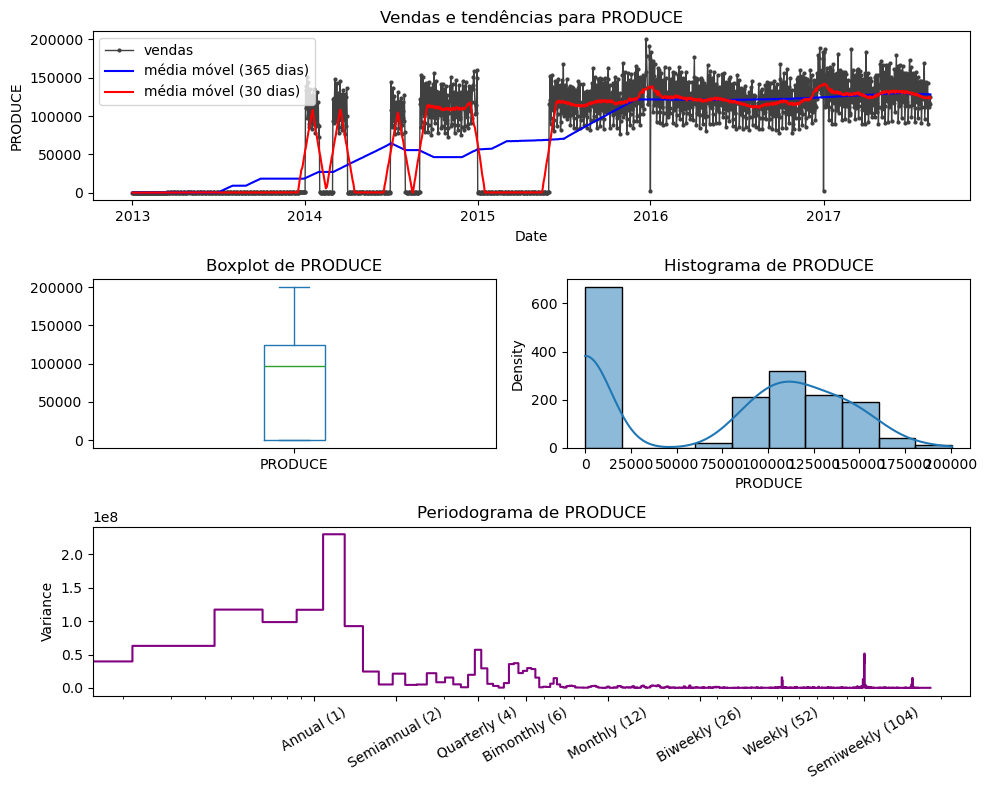

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


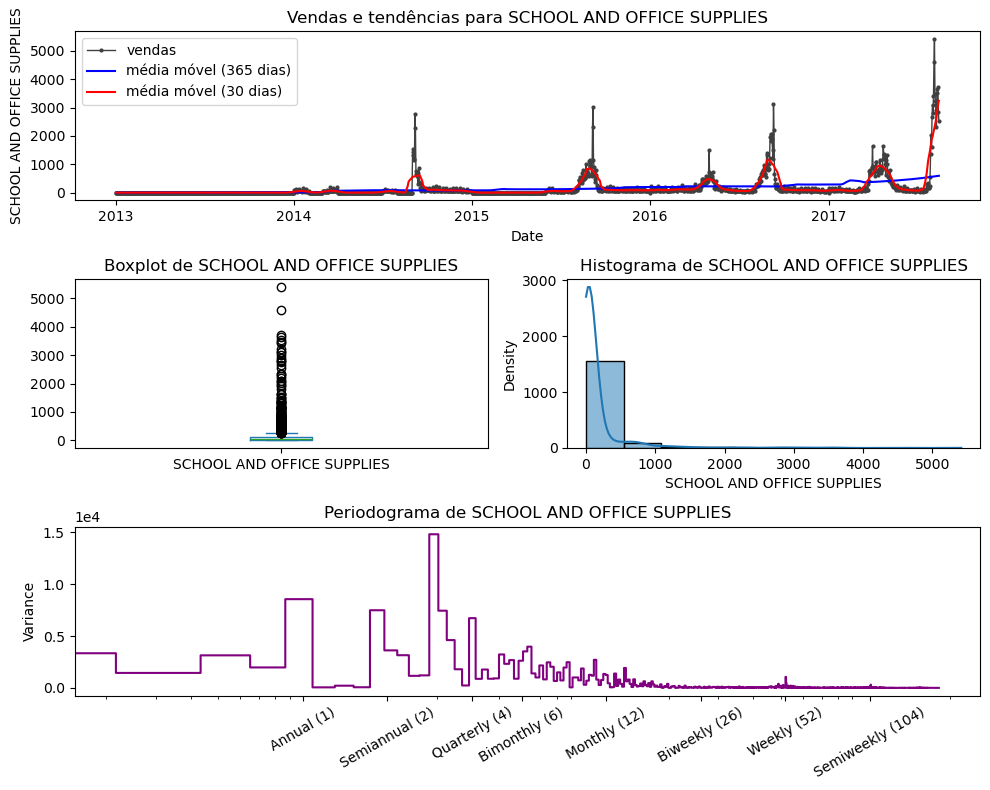

c:\Users\lhsca\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


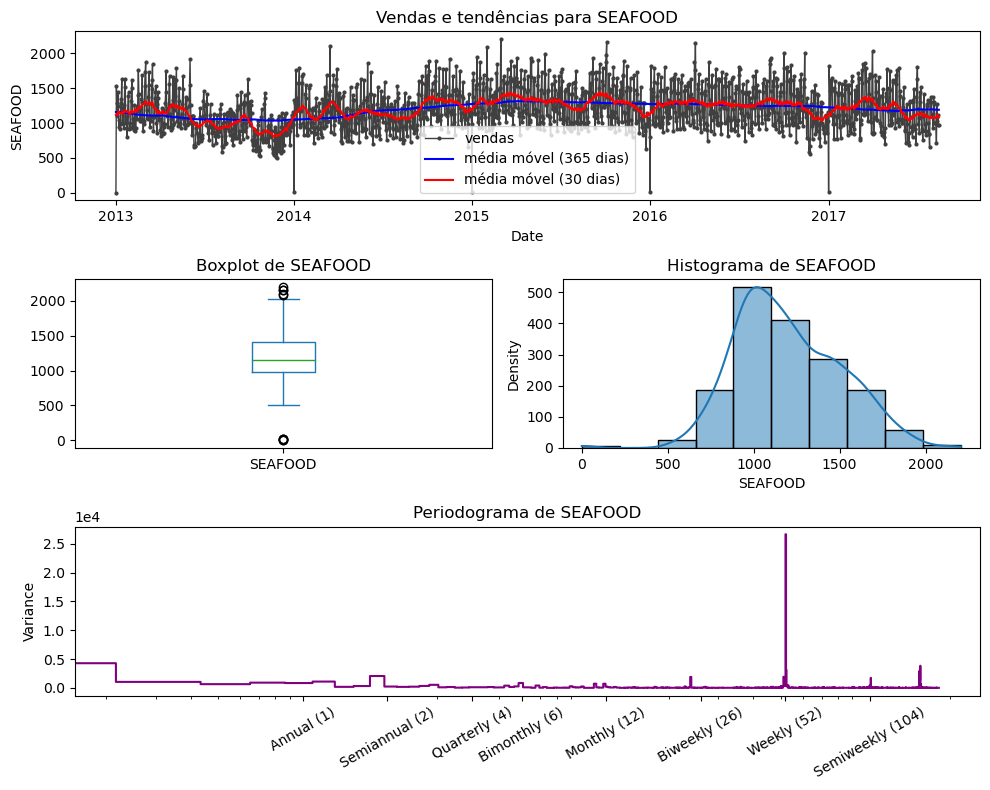

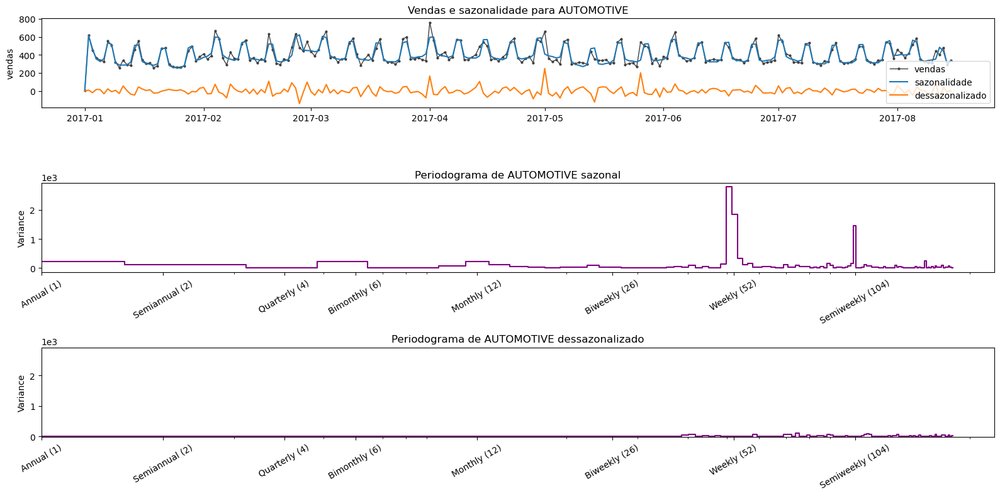

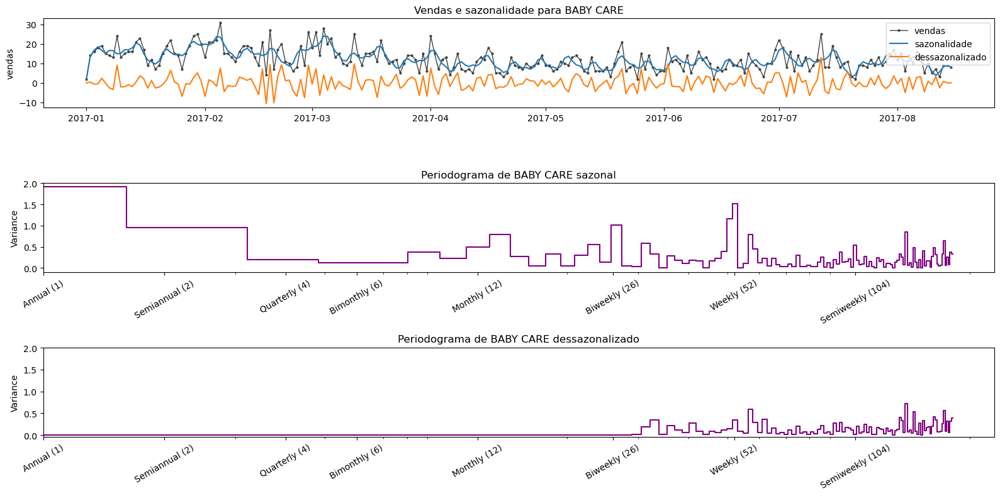

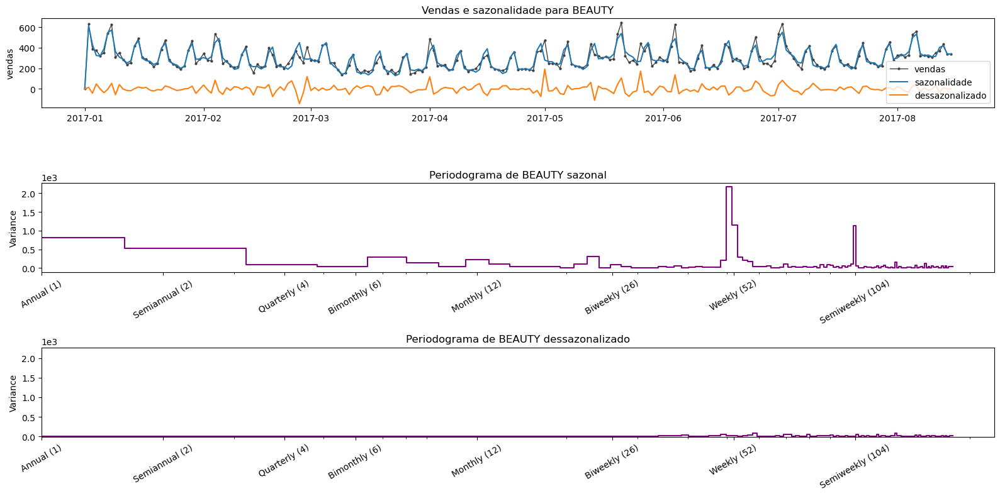

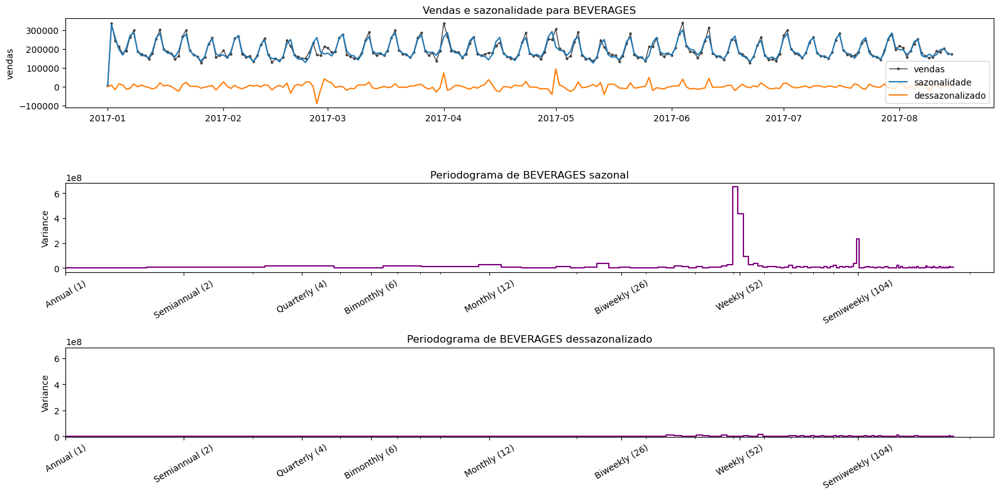

...

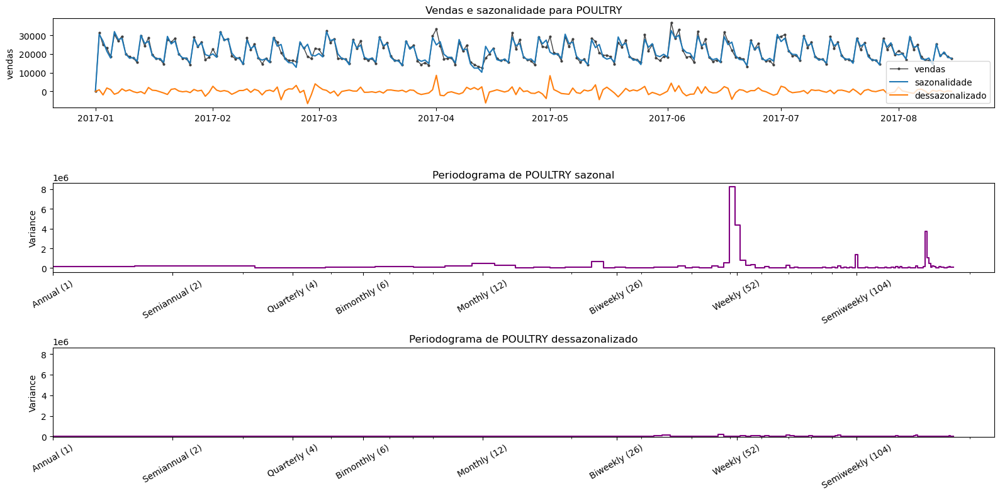

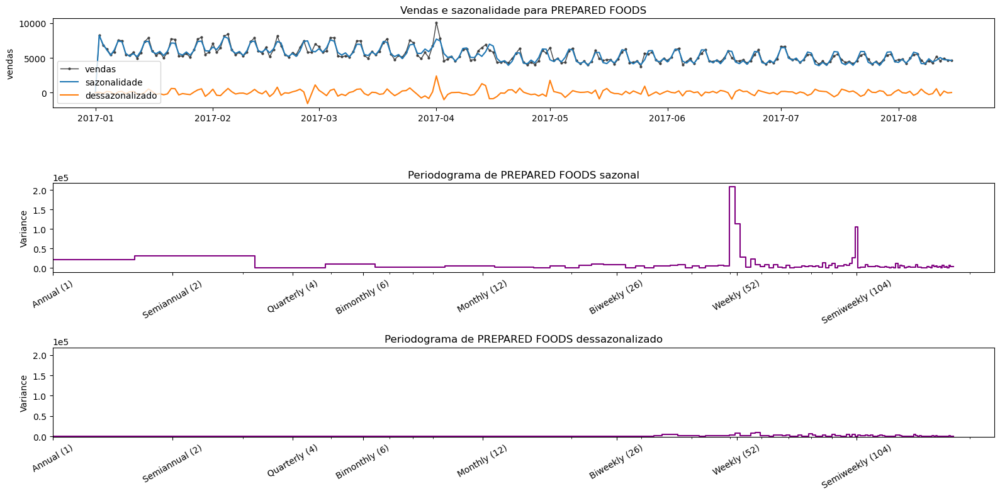

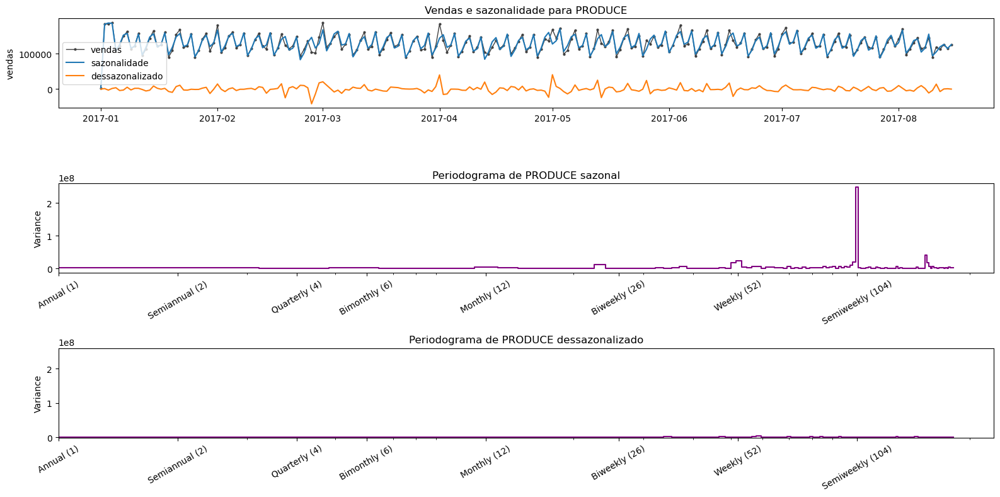

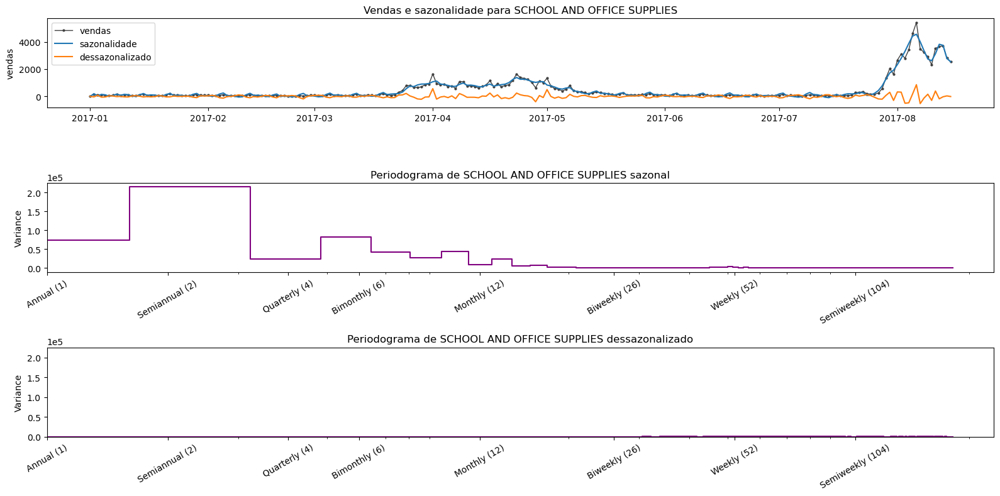

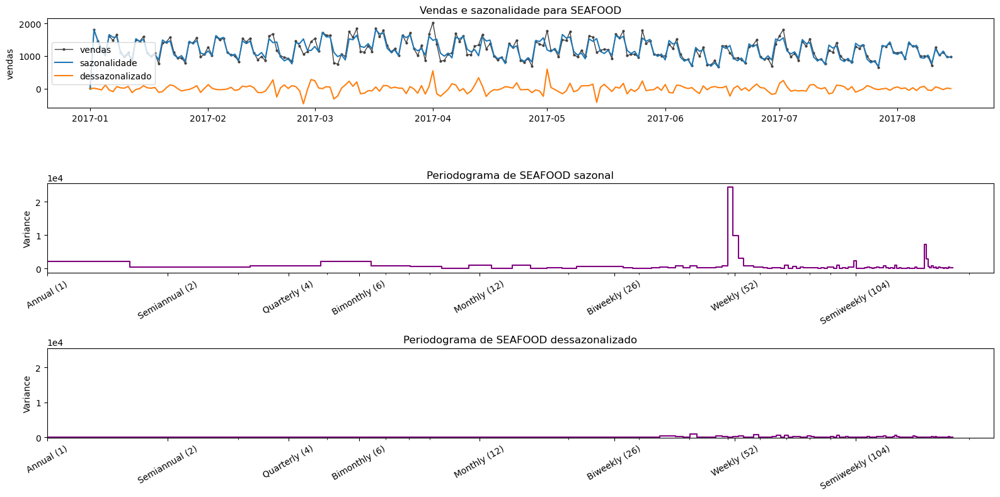

3


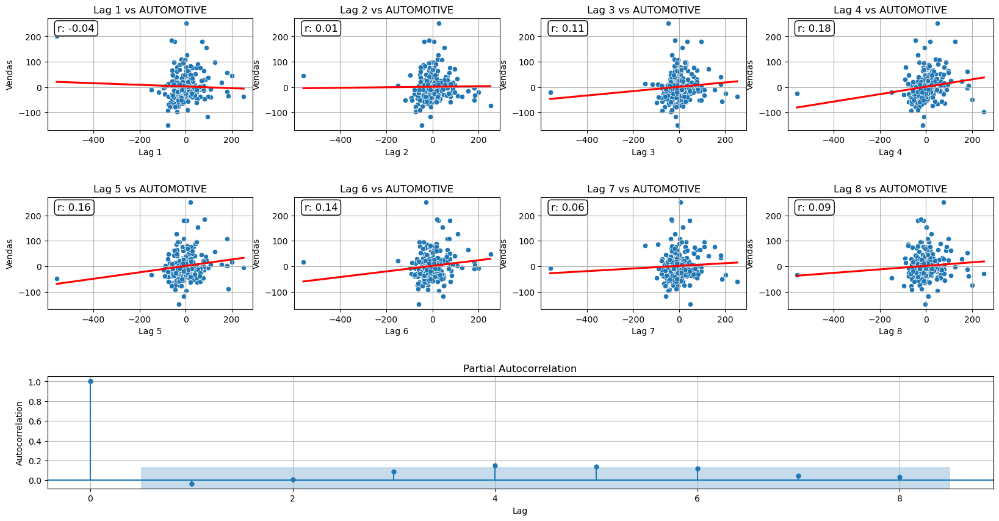

3


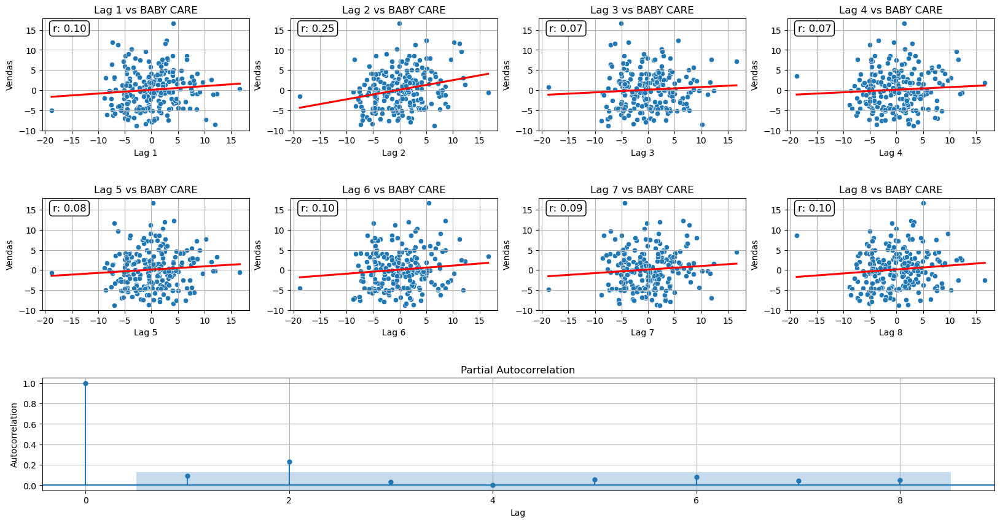

3


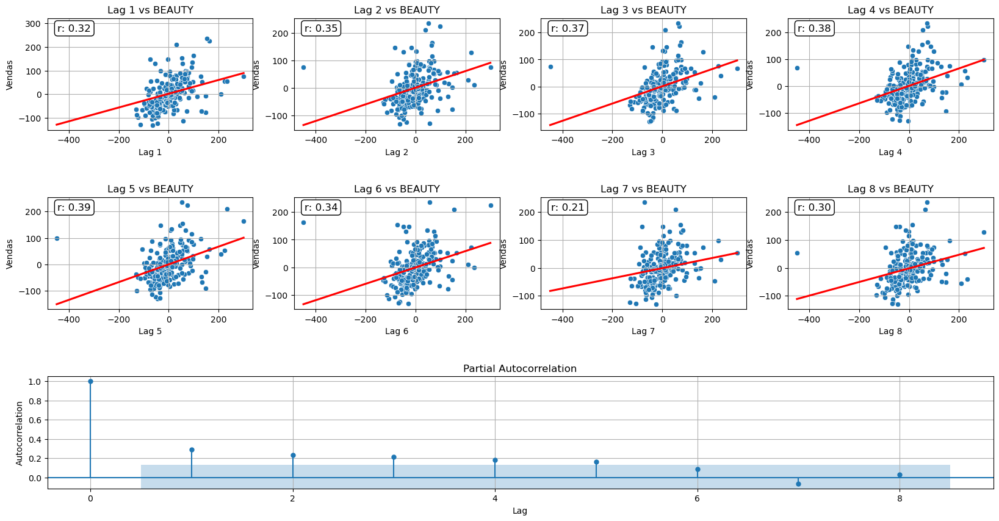

3


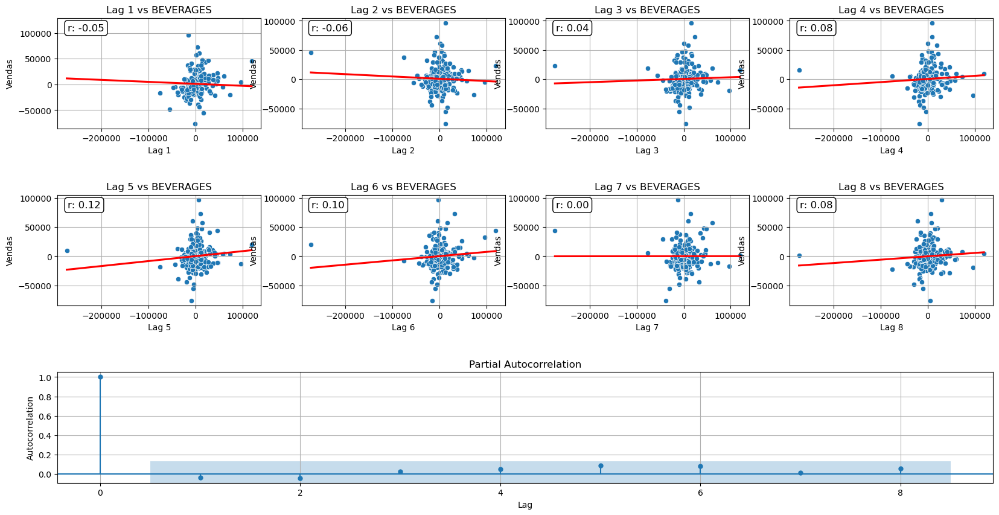

3


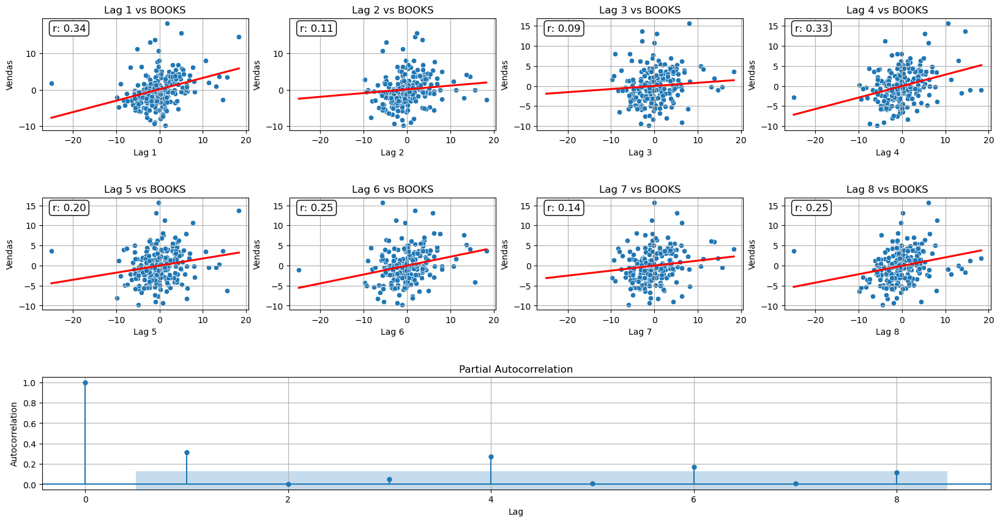

3


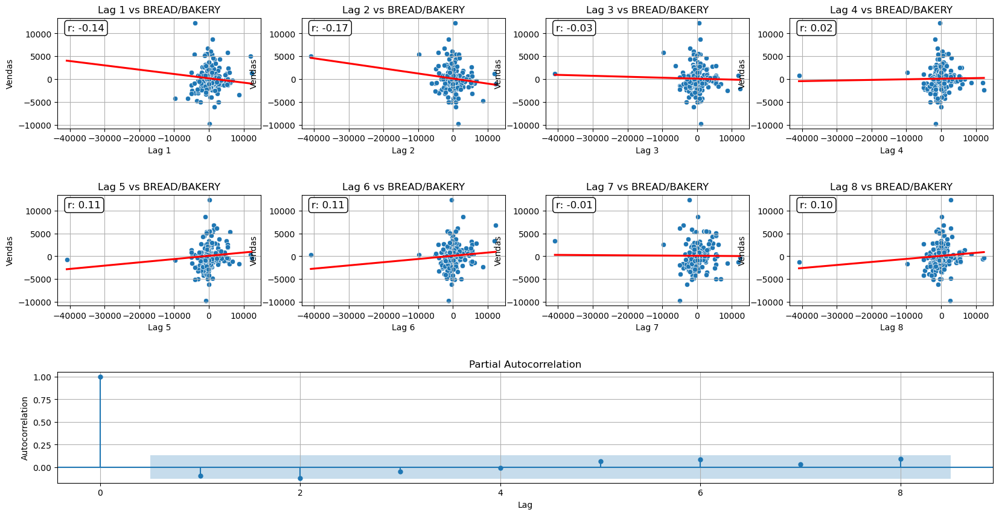

3


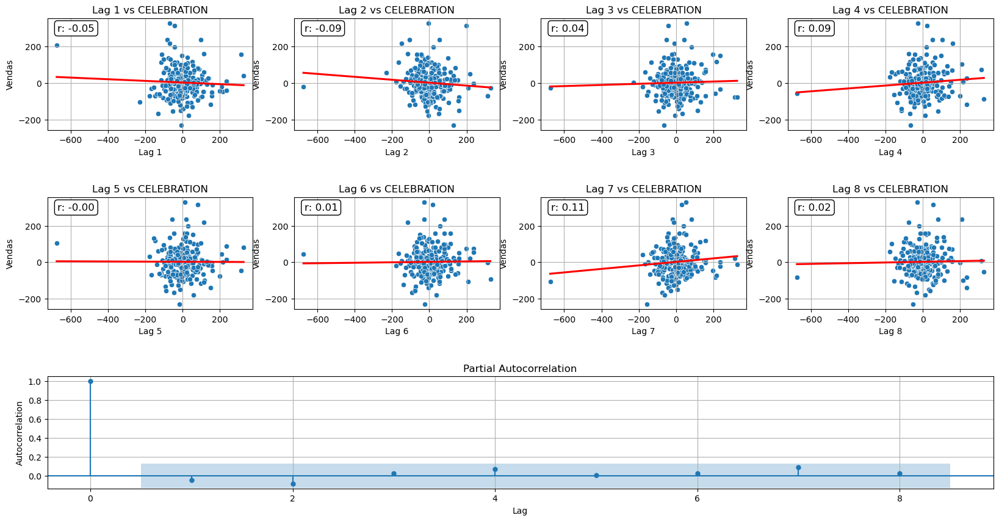

3


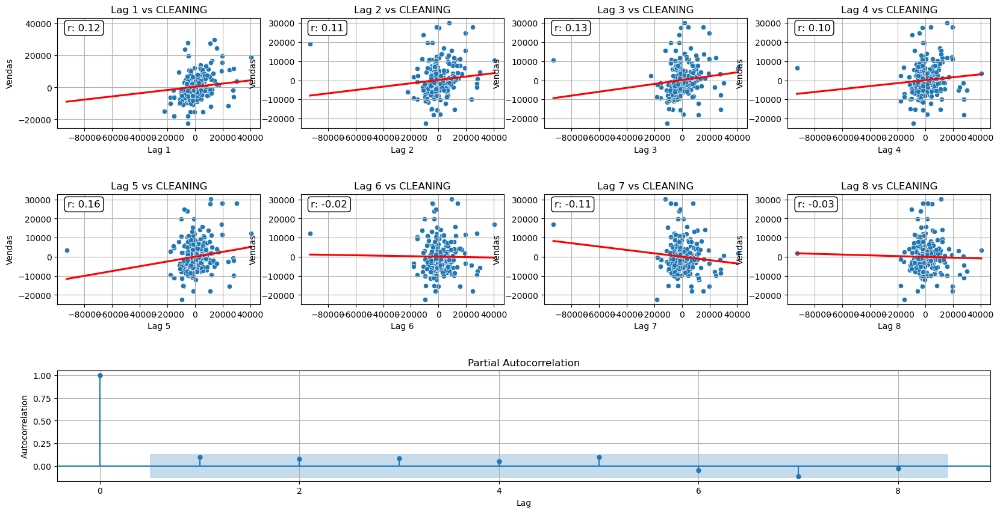

3


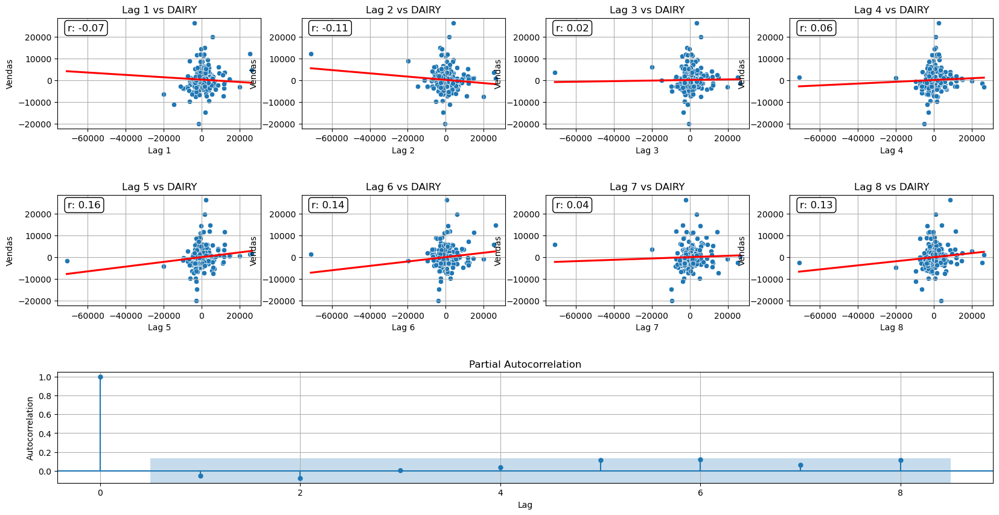

3


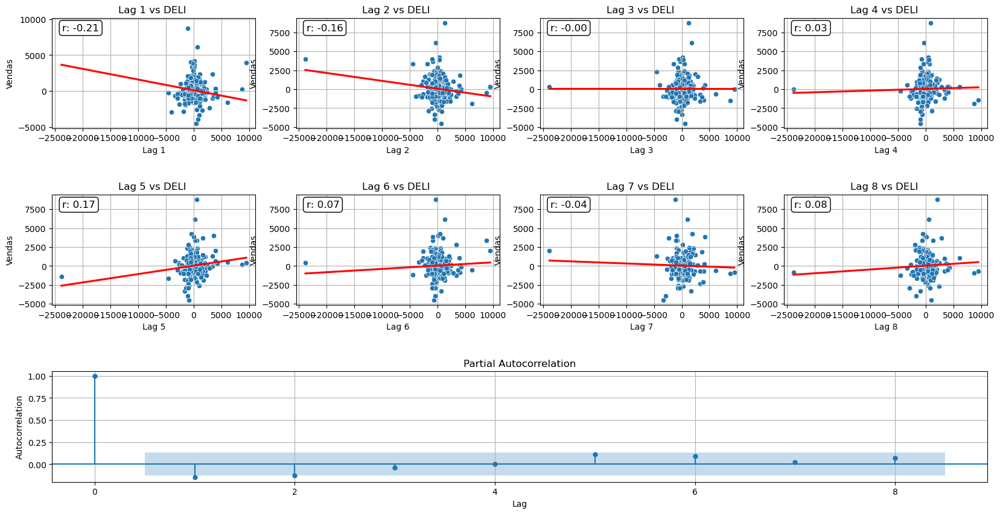

3


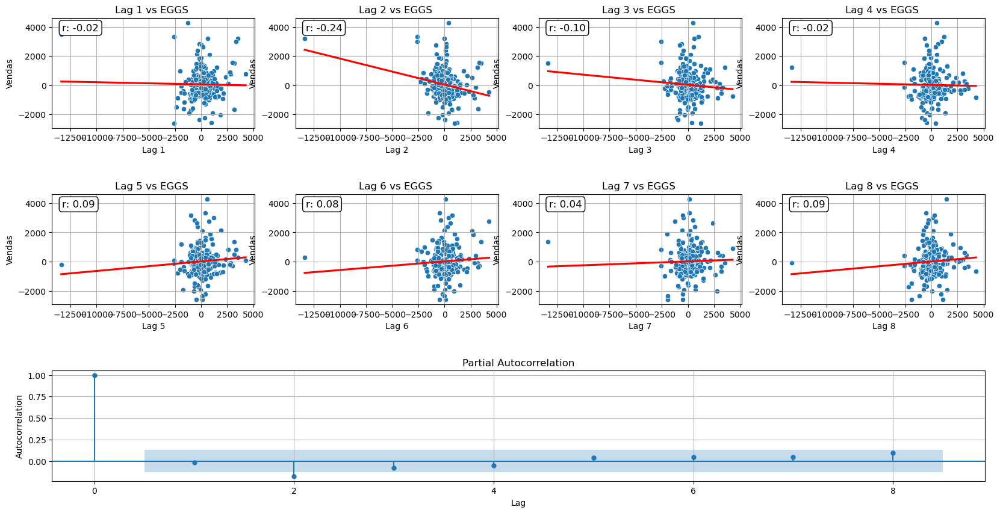

3


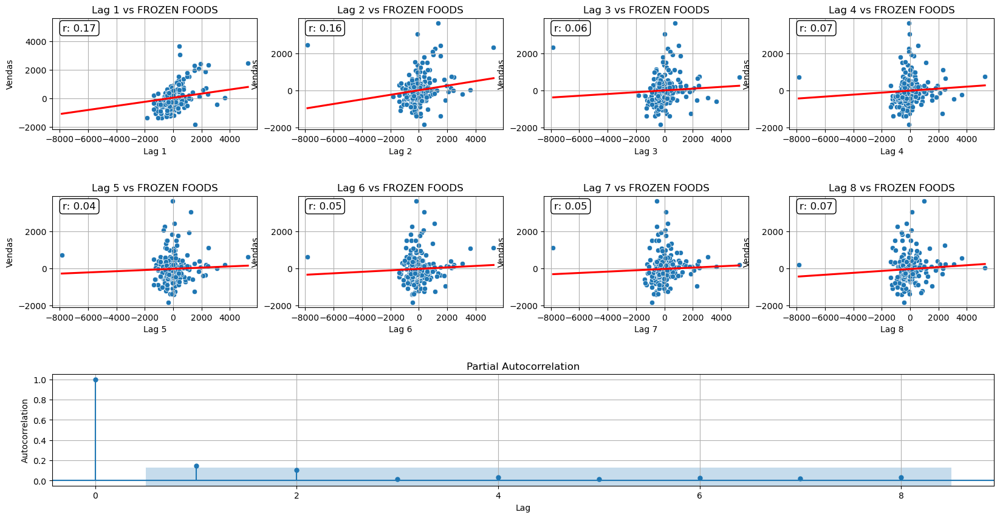

3


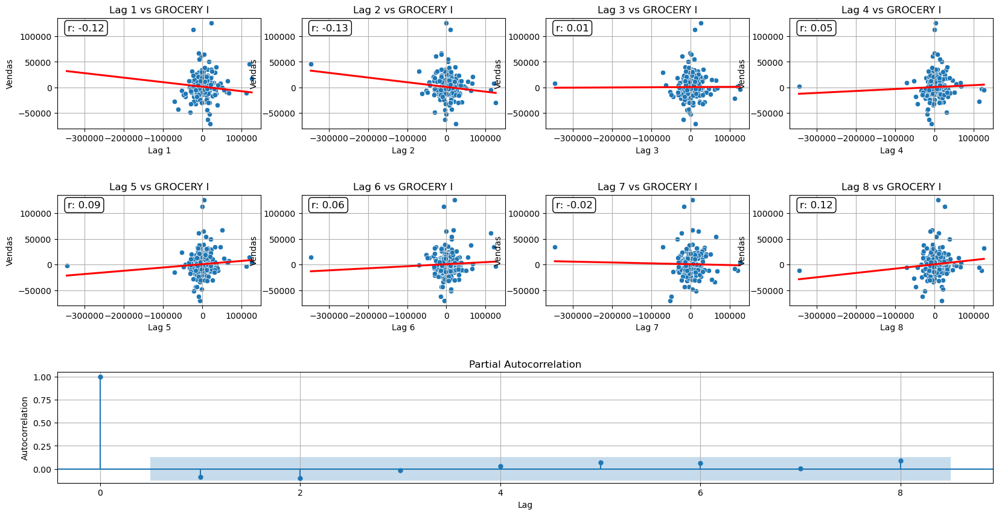

3


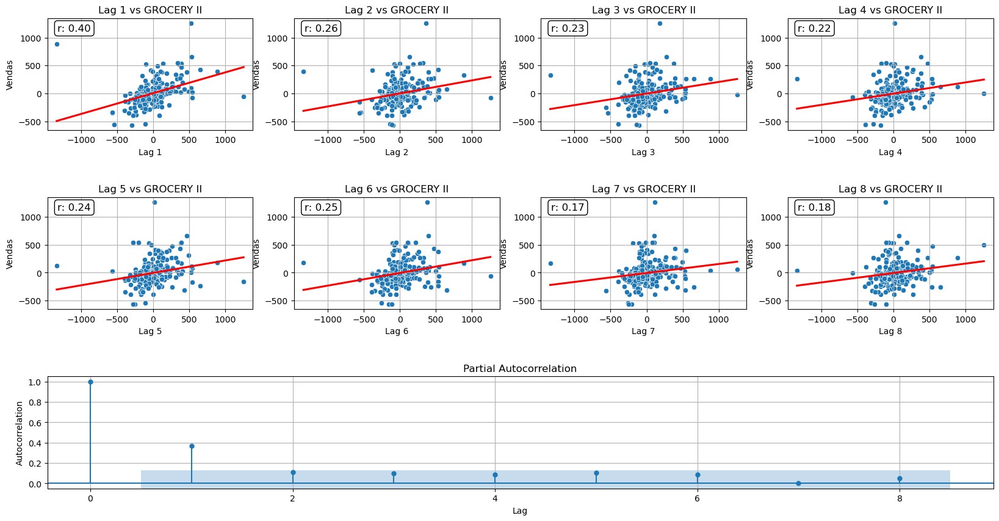

3


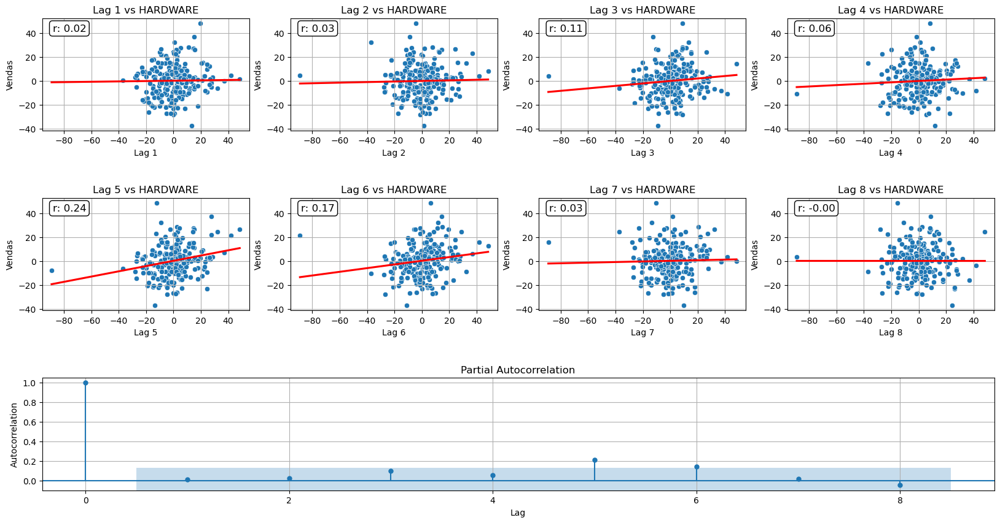

3


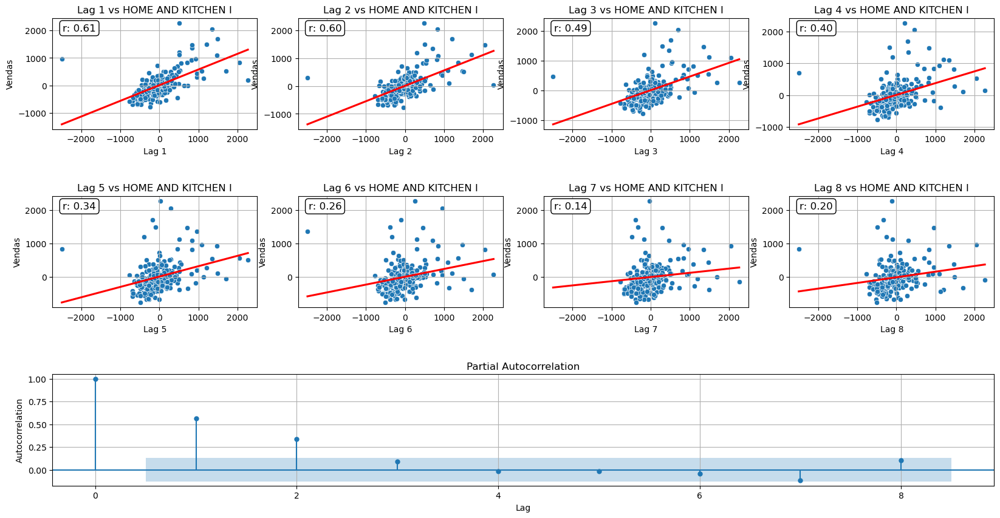

3


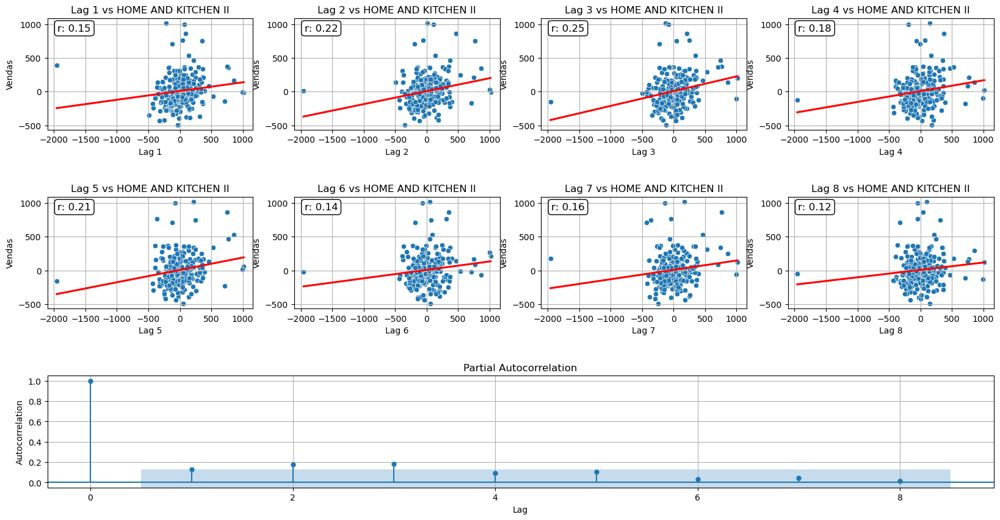

3


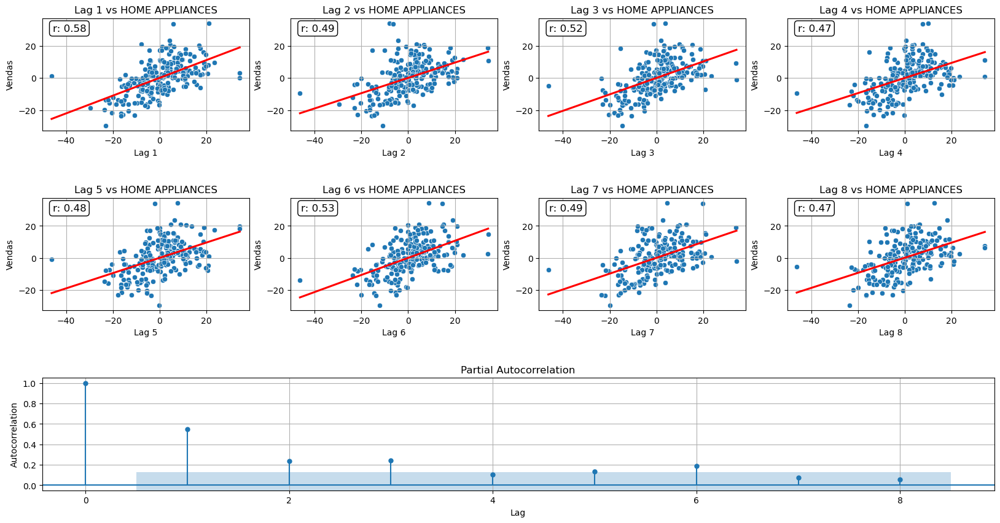

3


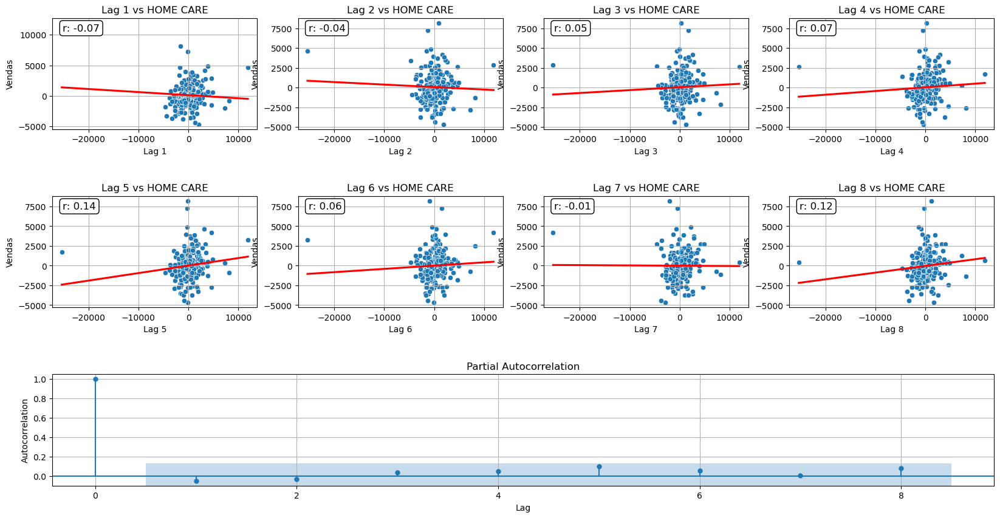

3


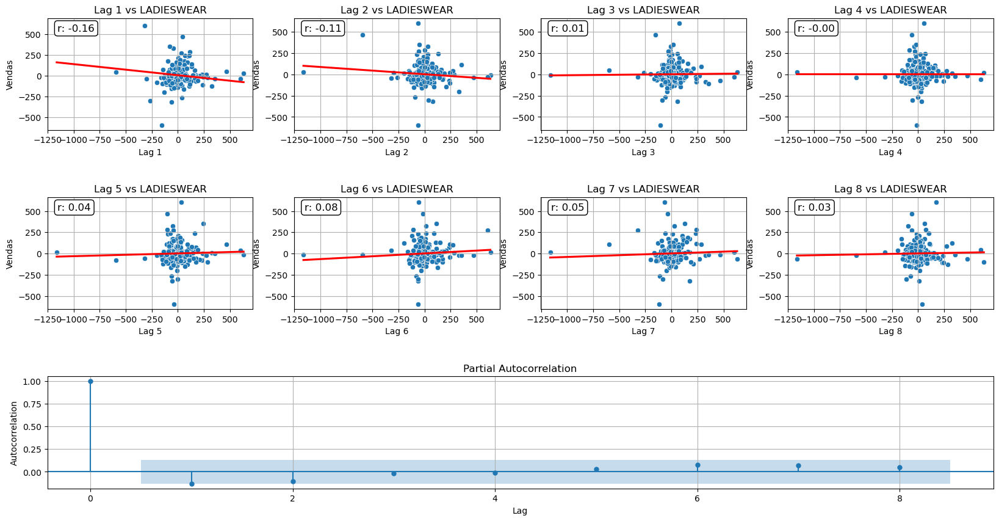

3


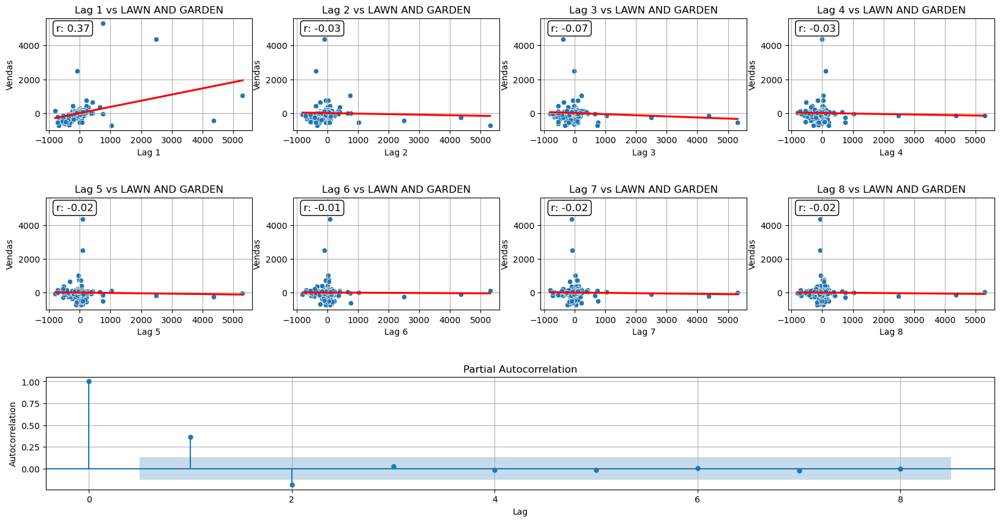

3


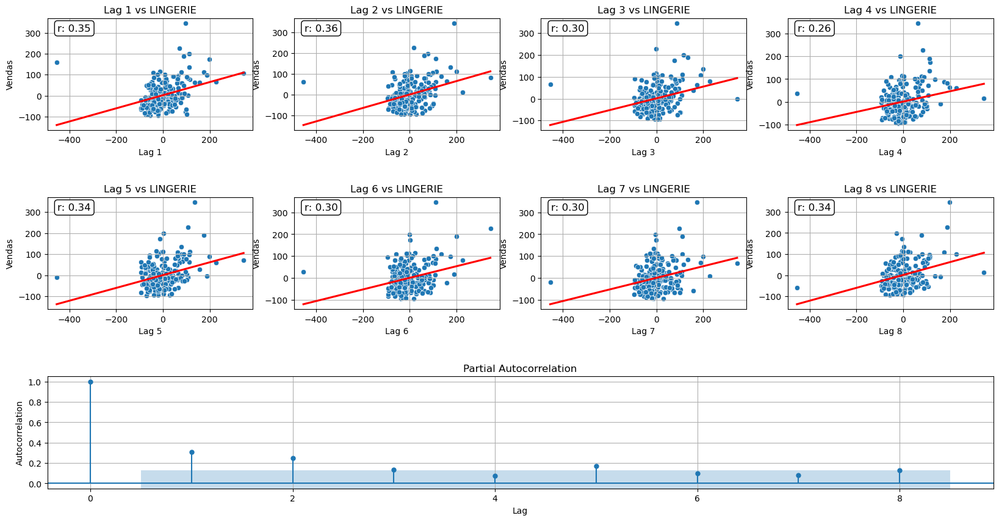

3


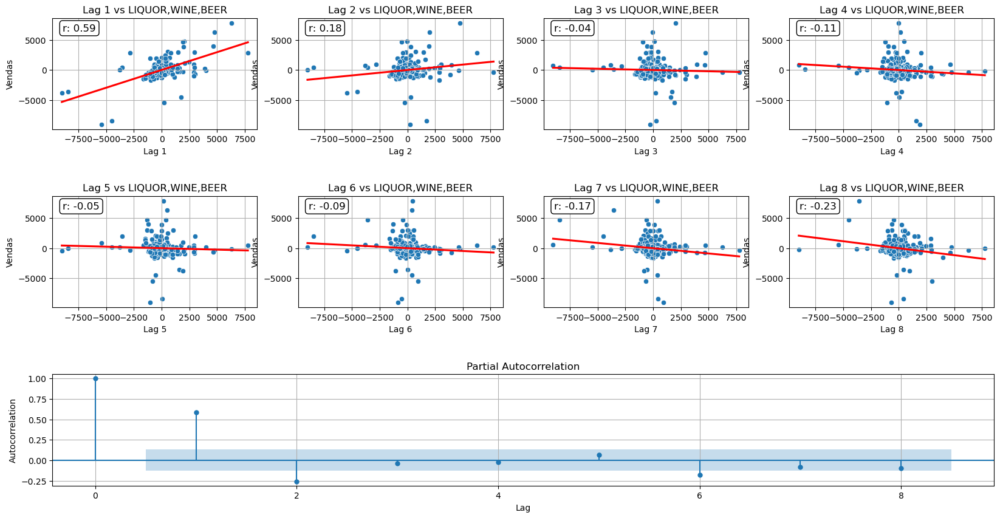

3


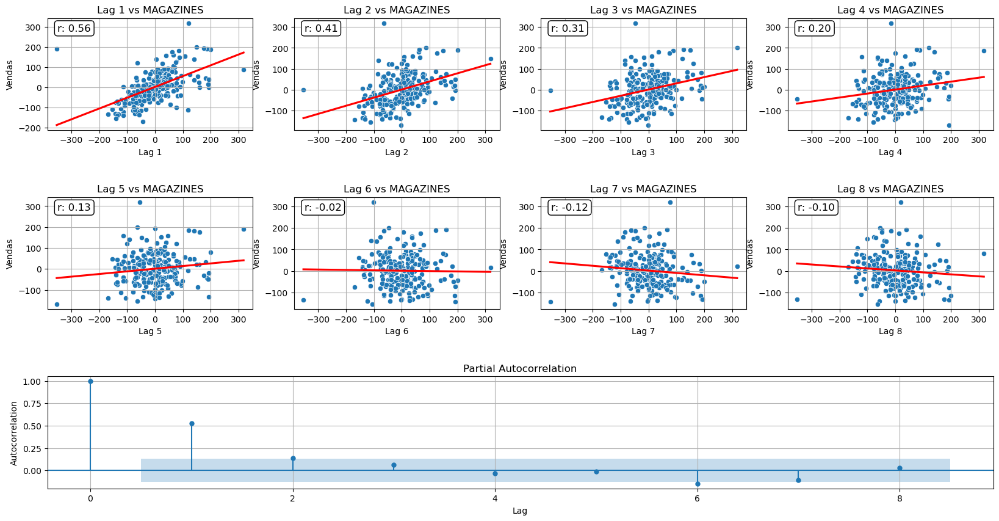

3


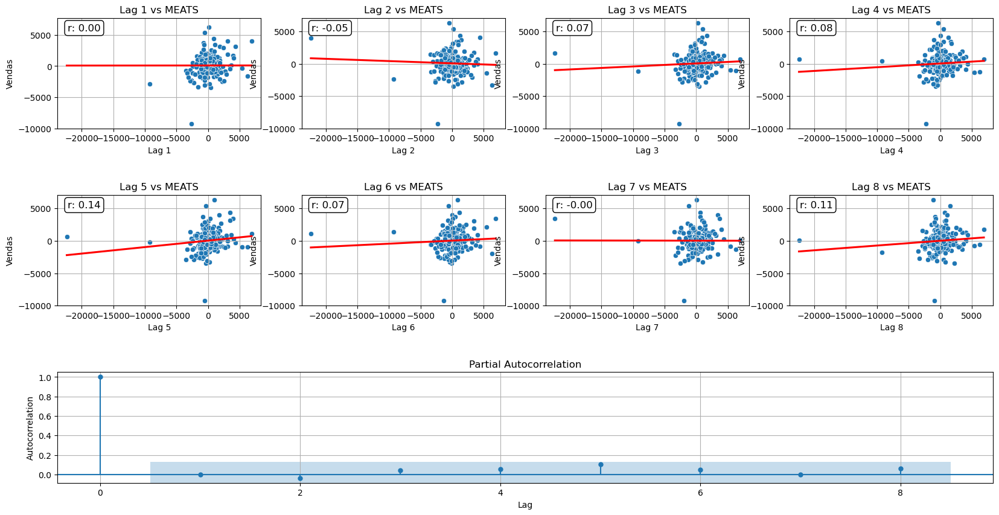

3


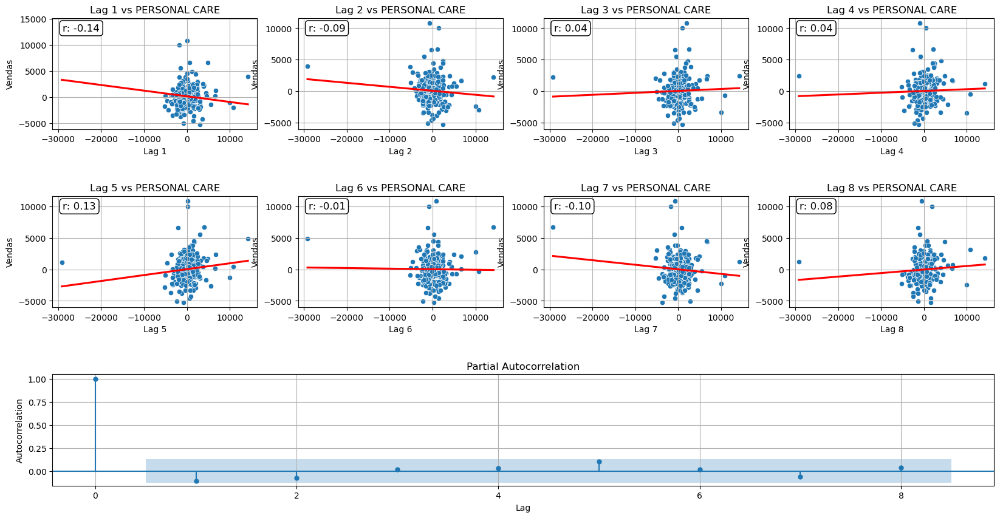

3


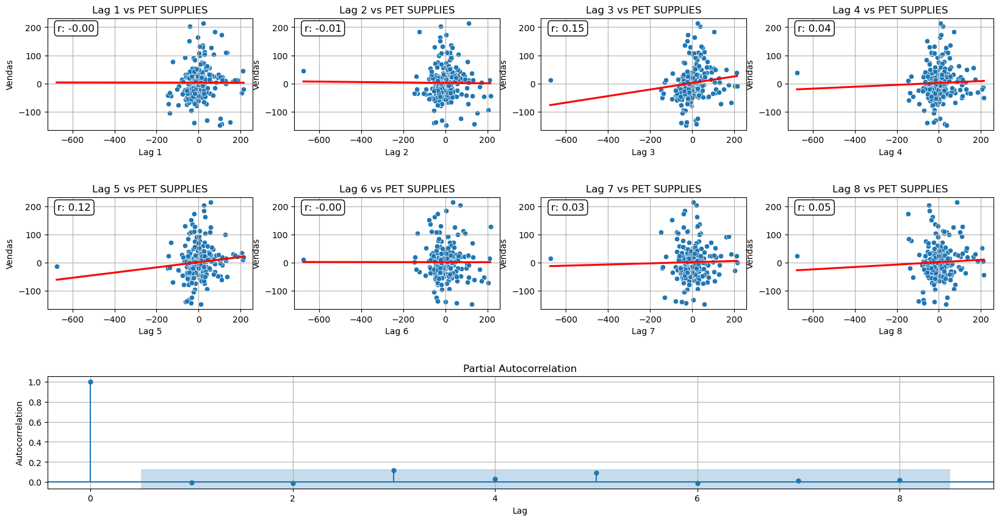

3


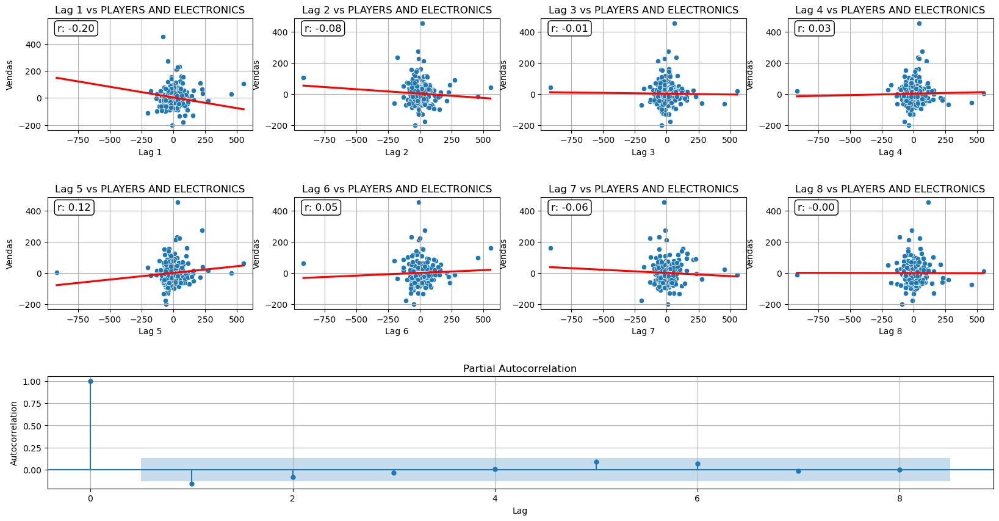

3


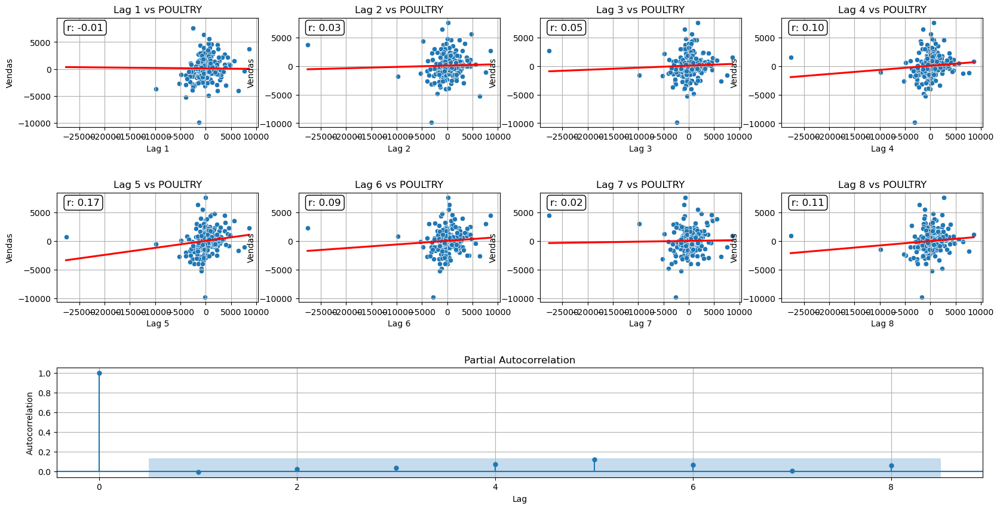

3


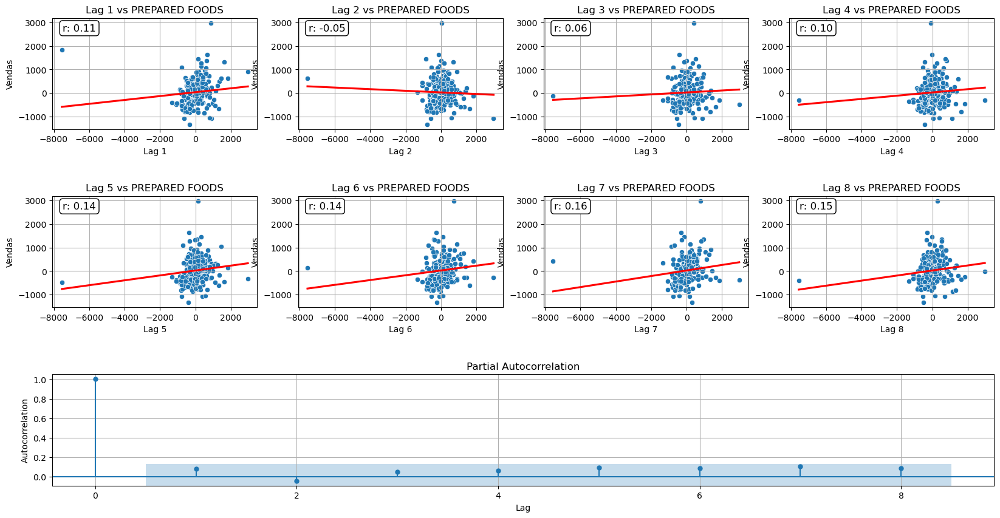

3


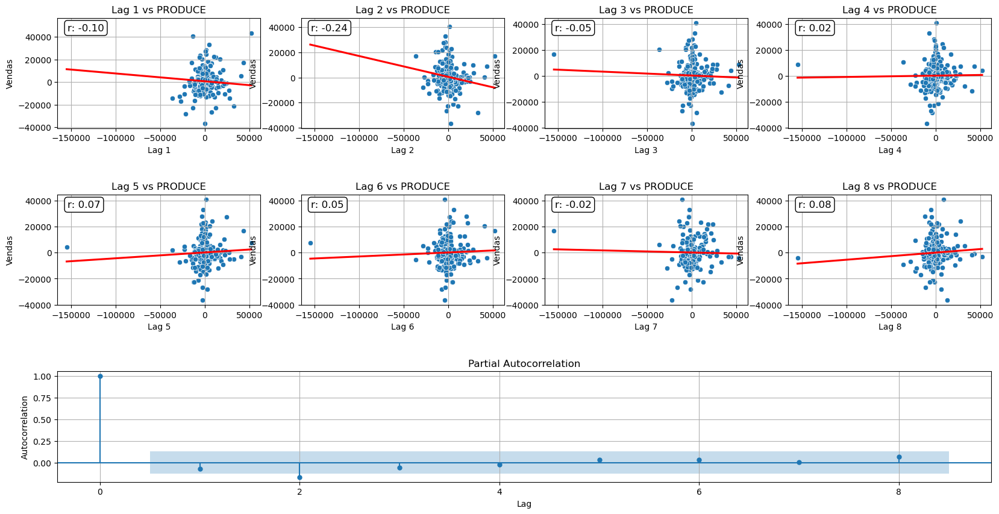

3


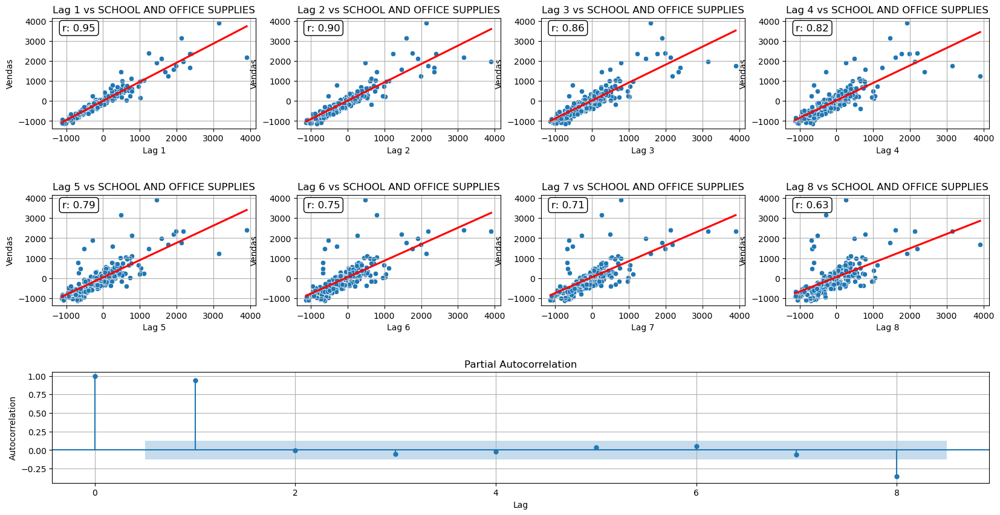

3


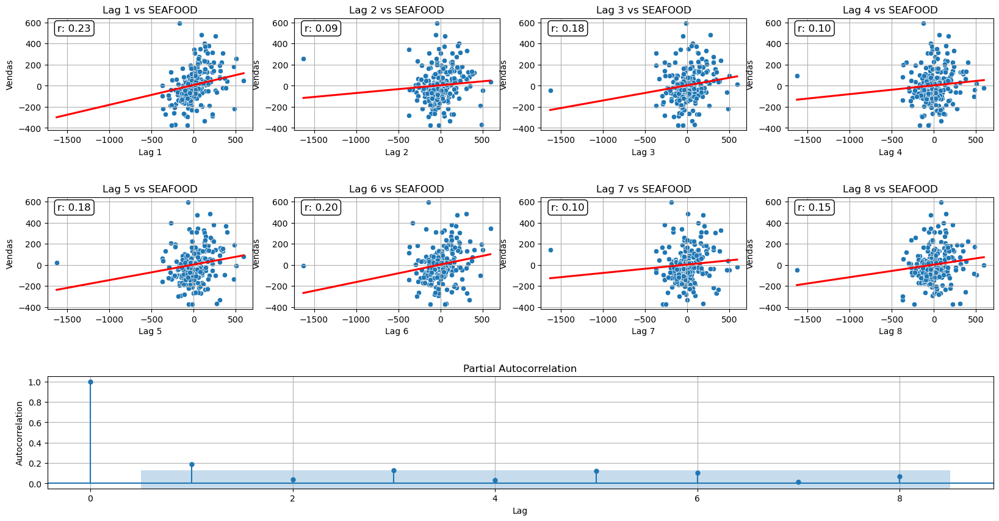

In [6]:
eda = EDA('train.csv')
eda.initial_exploitation()
eda.all_families_analysis()

eda = EDA('train.csv', initial = '2017-01-01')
eda.all_families_deseason('A', 26)
eda.all_families_lag(freq='M', order=4, max_lag=8)

## Pré-processamento

A classe Preprocessor implementada abaixo é um conjunto de métodos destinados a preparar e processar dados relacionados a vendas para análises posteriores. Ela inclui funcionalidades para importar dados de treinamento e teste a partir de arquivos CSV, bem como dados relacionados a feriados. Ele também cria um dataset agrupando os valores de vendas em cada coluna por loja e por família de produto. Este dataset será usado como dado de entrada para se estimar os parâmetros de uma série de fourrier usando regressão linear com o objetivo de utilizar essa série para remover a sazonalidade das vendas. O método generate_dataset coordena a importação e preparação desses dados, incluindo a manipulação de datas e a criação de um conjunto de dados estruturado. Outros métodos como fourier, generate_training_data, train_valid_split e generate_test_data são responsáveis por gerar conjuntos de dados específicos para treinamento, validação e teste, preparando características como características sazonais e feriados para análise. Essa classe facilita a geração de dados prontos para serem utilizados em modelos de regressão linear e XGBoost para previsões de vendas.

In [7]:
class Preprocessor():
    def __init__(self):

        self.train = None
        self.holiday_train = None
        self.test = None
        self.holiday_test = None
        self.dataset = None
        

    def import_train(self):
        self.train = pd.read_csv(
            'train.csv',
            usecols=['store_nbr', 'family', 'date', 'sales', 'onpromotion'],
            dtype={
                'store_nbr': 'category',
                'family': 'category',
                'sales': 'float32',
                'onpromotion': 'uint32',
            },
            parse_dates=['date'],
        )
        self.train['date'] = self.train.date.dt.to_period('D')
        self.train['item'] = "S" + self.train['store_nbr'].astype(str) + "_" + self.train['family'].astype(str)
        self.dataset = self.train.pivot(index='date', columns='item', values='sales')
        self.train=self.train.set_index(['date']).sort_index()

    def import_test(self):
        self.test = pd.read_csv(
            'test.csv',
            usecols=['store_nbr', 'family', 'date', 'onpromotion'],
            dtype={
                'store_nbr': 'category',
                'family': 'category',
                'onpromotion': 'uint32',
            },
            parse_dates=['date'],
        )
        self.test['date'] = self.test.date.dt.to_period('D')
        self.test['item'] = "S" + self.test['store_nbr'].astype(str) + "_" + self.test['family'].astype(str)
        self.test=self.test.set_index(['date']).sort_index()
    
    def import_holidays(self):
        holidays_events = pd.read_csv(
            "holidays_events.csv",
            dtype={
                'type': 'category',
                'locale': 'category',
                'locale_name': 'category',
                'description': 'category',
                'transferred': 'bool',
            },
            parse_dates=['date'],
        )       
        holidays_events = holidays_events.set_index('date').to_period('D')
        holidays = (
            holidays_events
            .query("locale in ['National', 'Regional']")
            .loc['2016':'2017-08-16', ['description']]
            .assign(description=lambda x: x.description.cat.remove_unused_categories())
        )
        holidays = pd.get_dummies(holidays, dtype=float)
        self.holidays_train, self.holidays_test = holidays[:"2017-08-01"], holidays["2017-08-01":"2017-08-15"]

    def fill_christmas(self):
        missing_dates = ['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25']
        date_objects = pd.to_datetime(missing_dates, format='%Y-%m-%d')
        missing_df = pd.DataFrame({'date': date_objects})
        missing_df['date'] = missing_df.date.dt.to_period('D')
        missing_df = missing_df.set_index(['date']).sort_index()
        self.dataset = pd.concat([self.dataset, missing_df])
        self.dataset.fillna(0, inplace=True)
        self.dataset.sort_index(inplace=True)
        self.dataset = self.dataset.rename_axis("item", axis="columns")

    def find_zeros(self):
        zero_sales = list(self.dataset.loc[:, (self.dataset == 0).all()].columns)
        self.train['available'] = np.where(self.train['item'].isin(zero_sales), 0, 1)
        self.test['available'] = np.where(self.test['item'].isin(zero_sales), 0, 1)


    def generate_dataset(self):
        self.import_train()
        self.import_test()
        self.import_holidays()
        self.fill_christmas()
        self.find_zeros()

    def fourier(self, y):
        fourier = CalendarFourier(freq='M', order=4)
        dp = DeterministicProcess(
            index=y.index,
            constant=True,
            order=1,
            seasonal=True,
            additional_terms=[fourier],
            drop=True,
        )
        return dp

    def generate_training_data(self, START, END):
        y = self.dataset.loc[START:END]
        # X1: Features for Linear Regression
        dp = self.fourier(y)
        X1 = dp.in_sample()
        X1['NewYear'] = (X1.index.dayofyear == 1)
        # X2: Features for XGBoost
        X2 = self.train.drop(['sales', 'store_nbr', 'item'], axis=1).loc[START:END]  # sobra apenas onpromotion
        le = LabelEncoder()
        le.fit(X2.family)
        X2['family'] = le.transform(X2['family'])
        X2["day"] = X2.index.day 
        X2 = X2.join(self.holidays_train, on='date').fillna(0.0)
        return  y, X1, X2
    
    def train_valid_split(self, y, X1, X2, split_date):
        split_datetime = datetime.strptime(split_date, "%Y-%m-%d")
        split_datetime2 = split_datetime + timedelta(days=1)
        split_date2 = split_datetime2.strftime("%Y-%m-%d")

        y_train, y_valid = y[:split_date], y[split_date2:]
        X1_train, X1_valid = X1[: split_date], X1[split_date2 :]
        X2_train, X2_valid = X2.loc[:split_date], X2.loc[split_date2:]
        return y_train, y_valid, X1_train, X1_valid, X2_train, X2_valid

    
    def generate_test_data(self, START, END):
        y = self.dataset.loc[START:END]
        # X1: Features for Linear Regression
        dp = self.fourier(y)
        X1 = dp.out_of_sample(steps=16)
        X1['NewYear'] = (X1.index.dayofyear == 1)
        # X2: Features for XGBoost
        X2 = self.test.drop(['store_nbr', 'item'], axis=1).loc[START:END]
        le = LabelEncoder()
        le.fit(X2.family)
        X2['family'] = le.transform(X2['family'])
        X2["day"] = X2.index.day 
        X2 = X2.join(self.holidays_test, on='date').fillna(0.0)
        return  X1, X2

## Modelo

A classe BoostedHybrid é um modelo híbrido que combina um regressor de regressão linear e um regressor XGBoost para prever séries temporais de vendas. Durante o processo de ajuste no método fit, a regressão linear é utilizada para remover a sazonalidade dos dados das vendas, capturando as tendências gerais e isolando os resíduos que contêm a variação sazonal. Esses resíduos são então utilizados como alvo para o regressor XGBoost, que captura padrões mais complexos e específicos dos dados, resultando em uma previsão mais precisa e livre de sazonalidade. O método predict utiliza os regressores treinados para fazer previsões nas entradas X_1 e X_2, combinando as previsões dos dois regressores para gerar a previsão final das séries temporais. O método validation_results calcula e imprime os erros de treinamento e validação, além de plotar gráficos comparando as vendas reais, as previsões do regressor linear e as previsões finais do modelo. O método generate_csv gera um arquivo CSV de submissão contendo as previsões finais do modelo para os dados de teste, formatados de acordo com as especificações do problema.

In [8]:
class BoostedHybrid:
    def __init__(self, model_1=Ridge(), model_2=XGBRegressor()):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None
        self.y_fit = None
        self.y_resid = None

    def fit(self, X_1, X_2, y):
        self.model_1.fit(X_1, y)
        y_fit = pd.DataFrame(
            self.model_1.predict(X_1), 
            index=X_1.index, columns=y.columns,
        )
        y_resid = y - y_fit
        y_resid = y_resid.stack().squeeze()
        self.model_2.fit(X_2, y_resid)
        self.y_columns = y.columns
        self.y_fit = y_fit
        self.y_resid = y_resid

    def predict(self, X_1, X_2):
        y_pred = pd.DataFrame(
            self.model_1.predict(X_1),
            index=X_1.index, columns=self.y_columns,
        )
        y_pred = y_pred.stack().squeeze()
        y_pred += self.model_2.predict(X_2)
        return y_pred.unstack()
    
    def validation_results(self, y_train, y_valid, y_fit, y_pred, verbose=True, plot=True):
            y_fit = y_fit.clip(0.0)
            y_pred = y_pred.clip(0.0)
            error_train = np.sqrt(mean_squared_log_error(y_train, y_fit))
            error_valid = np.sqrt(mean_squared_log_error(y_valid, y_pred))
            if verbose:
                print(f"erro de treinamento: {error_train}")
                print(f"erro de validação: {error_valid}")
            if plot:
                y = pd.concat([y_train, y_valid], axis=0)
                families = y.columns[0:6]
                axs = y.loc(axis=1)[families].plot(
                    subplots=True, figsize=(11, 9), marker='.', linestyle='-',
                    color='0.25', label='vendas', linewidth=1, markersize=4, alpha=0.5)
                _ = y_fit.loc(axis=1)[families].plot(subplots=True, color='C0', ax=axs)
                _ = y_pred.loc(axis=1)[families].plot(subplots=True, color='C3', ax=axs)
                for ax, family in zip(axs, families):
                    ax.legend([])
                    ax.set_ylabel(family)
                plt.show()
            return error_train, error_valid
    
    def generate_csv(self, y_test):
        y_test = y_test.reset_index(drop=False)
        y_test = y_test.rename(columns={'index': 'date'})
        y_test['date'] = y_test['date'].astype(str)
        unpivoted = (y_test
                        .melt(id_vars='date', var_name='item', value_name='sales')
                        )
        unpivoted[['store_nbr', 'family']] = unpivoted['item'].str.extract(r'S(\d+)_(.+)')
        unpivoted = (unpivoted
            .dropna()
            .drop(['item'], axis=1)
        )
        output = pd.read_csv(
                    'test.csv',
                    usecols=['id','store_nbr', 'family', 'date', 'onpromotion'],
                    dtype={
                        'store_nbr': 'category',
                        'family': 'category',
                        'onpromotion': 'uint32',
                    },
                    parse_dates=['date'],
                )
        output['date'] = output['date'].astype(str)
        output = output.merge(unpivoted, on=['date', 'store_nbr', 'family'], how='left', suffixes=('', '_unpivoted'))
        output = output.drop(['date', 'store_nbr', 'family','onpromotion'], axis=1)
        output.to_csv('submission.csv',index=False)

## Otimização de hiperparâmetros

Nesta parte é realizada uma busca exaustiva por hiperparâmetros otimizados para um modelo híbrido de regressão linear combinado com um regressor XGBoost, utilizando loops aninhados para iterar sobre diversas combinações de hiperparâmetros. Ele cria instâncias da classe Preprocessor para preparar os dados de treinamento e validação, gera conjuntos de dados específicos para treinamento e validação, e ajusta o modelo BoostedHybrid para cada combinação de hiperparâmetros. Durante o processo, o código calcula os erros de treinamento e validação para cada modelo ajustado e atualiza o melhor modelo encontrado, exibindo os melhores hiperparâmetros e os erros associados. Essa abordagem sistemática busca encontrar a combinação de hiperparâmetros que produz o modelo mais eficaz para prever as séries temporais de vendas.

In [9]:
preprocessor = Preprocessor()
preprocessor.generate_dataset()
y, X1, X2 = preprocessor.generate_training_data('2017','2017')
y_train, y_valid, X1_train, X1_valid, X2_train, X2_valid = preprocessor.train_valid_split(y, X1, X2, "2017-07-01")

model1_list = [LinearRegression(), Lasso(), Ridge()]
n_estimators_list = [100, 500, 1000]
learning_rate_list = [0.01, 0.05, 0.1]
max_depth_list = [3, 6, 9]

best_model = list()
best_valid_error = 5
best_train_error = 5

for model1 in model1_list:
    for n_estimators in n_estimators_list:
        for learning_rate in learning_rate_list:
            for max_depth in max_depth_list:
                model = BoostedHybrid(
                    model_1=model1,
                    model_2=XGBRegressor(
                        n_estimators=n_estimators,
                        learning_rate=learning_rate,
                        max_depth=max_depth
                    )
                )
                model.fit(X1_train, X2_train, y_train)
                y_fit = model.predict(X1_train, X2_train)
                y_pred = model.predict(X1_valid, X2_valid)
                error_train, error_valid = model.validation_results(y_train, y_valid, y_fit, y_pred, plot=False, verbose=False)
                if error_valid < best_valid_error:
                    best_valid_error = error_valid
                    best_train_error = error_train
                    best_model = [model1, n_estimators, learning_rate, max_depth]
                    print(f"melhor modelo: {best_model}")
                    print(f"erro de treinamento: {error_train}")
                    print(f"erro de validação: {error_valid}")

melhor modelo: [LinearRegression(), 100, 0.01, 3]
erro de treinamento: 0.6348459116391164
erro de validação: 0.604789224041142


c:\Users\lhsca\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(


melhor modelo: [Lasso(), 100, 0.01, 3]
erro de treinamento: 0.7021129914760096
erro de validação: 0.5821620403749413


c:\Users\lhsca\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
c:\Users\lhsca\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
c:\Users\lhsca\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, toleranc

melhor modelo: [Ridge(), 100, 0.01, 3]
erro de treinamento: 0.654567785089552
erro de validação: 0.5743636818263379


In [10]:
# retreinando com todos os dados de treino
model = BoostedHybrid(model_1=best_model[0],
                      model_2=XGBRegressor(
                        n_estimators=best_model[1],
                        learning_rate=best_model[2],
                        max_depth=best_model[3],
                    ))
model.fit(X1, X2, y)
# fazendo a previsão para o dataset de teste
X1_test, X2_test = preprocessor.generate_test_data('2017','2017')
y_test = model.predict(X1_test, X2_test)
model.generate_csv(y_test)